# Navigating Car Accidents in Santiago, Chile
- Name: Cristobal Zamorano Astudillo 
- Class: Data 200, Fall 2019 - University of California, Berkeley
- Date: December 13, 2019

_Disclaimer: Original idea of this project was taken for [How safe are the streets of Santiago?](https://towardsdatascience.com/how-safe-are-the-streets-of-santiago-e01ba483ce4b), an article written by a Chilean Professor who does an exploratory analysis of Santiago's accidents of 2018 using GeoPandas. This project contains a superset of that article's dataset and some snippets of code from the article. However, we have included a much wider and diverse datasets. This disclaimer's purpose is to give credit to the inspiration of this project and by no means this project objective is the same as the article. The intention of this project is to apply the Data Science Lifecycle and Machine Learning  algorithms to make decisions in the future on how we can start thinking in effective policies to prevent deathly car accidents. Thank you.__

## Introduction

We are using Santiago, Chile as our city of interest since it is considered [one of the most populated cities in South America by 2019](https://en.wikipedia.org/wiki/List_of_South_American_metropolitan_areas_by_population). With a population of near 7 million people and an area of $247.5 mi^2$, Santiago makes an interesting case study. According to [INE (National Institute of Chilean Statistics)](https://www.t13.cl/noticia/nacional/ine-y-proyecciones-poblacion-censo-2017-2050-habra-216-millones-personas-chile), the increment of the Chilean population will increase by 2,8 million people by 2050. Today's dense population and projections of increased population, raises concern for future safety.

We want to investigate if there are conditions such as time or place, where the probability of deathly car accidents increase. In doing so, we can present the most important features that lead to deathly car accidents to the government, so that they they can create policies to prevent accidents based on solid data analysis. 


Our hypothesis and goal that we are trying to achieve in this project is to know __based on the car accidents data collected by the Chilean government, is it possible to construct a model powerful enough to predict if people would die or not when they engage in a car accident and what are the most important features that support the predictions.__ 

In [1]:
import numpy as np
import pandas as pd
import re
import calendar

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline

import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon
from pylab import rcParams

In [2]:
# sns.set(context='paper', style='ticks', palette='rainbow_r')
mpl.rcParams['figure.dpi']= 150
sns.mpl.rc("figure", figsize=(10, 6))
sns.set(palette='rainbow_r')
import matplotlib.style as style
style.use('fivethirtyeight')

In [3]:
# import zipfile
# with zipfile.ZipFile('./data/santiago_data.zip', 'r') as zip_ref:
#     zip_ref.extractall('./data')

## Data Collection and Cleaning

We proceed to look for the necessry data. For this project we used:
- Vector Maps: gives as the shape, perimeter, area of the city.
- Streets Maps: to have the name of the streets so we can plot onto the Vector Maps.
- Accidents Data: this where mostly of our prediction and analyisis will happen.
- 2017 Census Data: data about the population density of each district. 

### Loading the Vector Maps

This dataset can be download [here](https://www.bcn.cl/obtienearchivo?id=repositorio/10221/10405/2/Areas_Pobladas.zip). This dataset is a zip file __Vector Maps of Chilean cities__. The zip file contains different data format of 387 cities and towns of the Chilean territory. The data was compiled by the [__Chilean National Congress LIbrary (BCN)__](https://www.bcn.cl/), which is a service of the Chilean Senate and the Chamber of Deputies whose mission is "to contribute to the linking of the National Congress of Chile with citizens, giving access to its legal and historical heritage, and promoting instances of dialogue and reflection between parliamentarians and civil society." 

The idea behind the Vector Maps is to look for a city of interest coordinate system to visualize our data. In this project we restricted ourselves to analyze the chilean capital, Santiago. In other words, we will only be using a very small subset of this dataset.


We will proceed cleaning the data:
- We will translate the names of columns from Spanish to English.
- We will translate the type of community to from Spanish to English.
- We will exclude 13 cities that have questionable names. We drop these rows because for our purpose we are only interested in an spoecific city's geodata. We thought that it is necessary to clean entire dataset as much as possible for future study.

In [4]:
cities = gpd.read_file("data/BCN/areas_urbanas/areas_urbanas.shp", encoding='utf-8')
cities = cities.rename(columns = {"NOMBRE": "Name", "TIPO_AREA":"Area Type"})
cities["Area Type"].replace(inplace=True,to_replace="Ciudad",value="City")
cities["Area Type"].replace(inplace=True,to_replace="Pueblo",value="Town")
cities["Area Type"].replace(inplace=True,to_replace="Aldea",value="Village")
cities["Area Type"].replace(inplace=True,to_replace="Localidad",value="Small Town")
cities["Area Type"].replace(inplace=True,to_replace="Caserio",value="Rural Community")
cities = cities[cities["Name"].str.contains("\w[\s]?", na=False)]
cities.reset_index(drop=True, inplace=True)
cities.tail()

,Name,Area Type,SHAPE_Leng,SHAPE_Area,geometry
382,Calama,City,7266.159446,1.085889e+06,"POLYGON ((507769.380 7513016.014, 507675.867 7..."
383,Puerto Aysen,City,5410.583898,1.123116e+06,"POLYGON ((210689.999 4964388.485, 210703.516 4..."
384,Cohaique,City,17677.879995,6.317038e+06,"POLYGON ((259973.620 4947324.020, 259774.760 4..."
385,Chile Chico,Town,5641.875304,1.283623e+06,"POLYGON ((291972.658 4842628.158, 292039.346 4..."
386,Talcahuano,City,83548.165913,3.100519e+07,"POLYGON ((136052.580 5921780.429, 133504.854 5..."


Let's identify our city of interest's coordinates, which again is Santiago.

Working we geodata also requires us to work in an specific coordinate system. In cartography, the act of transforming coordinates from 3d to a 2d plane is called Projection. In the Data 100 - Fall 2019 class we dicussed about the mathematical concept of Projections from Linear algebra ad how they are related to PCA, a unsupervised learning technique used to reduce the Dimensionality of the data. We won't be using PCA in this project, but the idea of Projection is somewhat similar in cartography. 

We decided to use the __EPSG:4326__ projection since most our data came from as unprojected *datum*. A *datum* is defined by Corey [in his article](https://source.opennews.org/articles/choosing-right-map-projection/) as a mathematical modeling of the Earth to the shape of a spheroid. In other words, it is geometric approximation. Each *datum* has a different type of projections, "but a spatial reference system is only "projected: when it has been mathematically translated to a 2D surface".

EPSG:4326 is one of the most conventional ones and we will stick to it.

In [5]:
santiago_map = cities[cities["Name"] == "Santiago"]
santiago_map = santiago_map.to_crs({'init': 'epsg:4326'})

Using `Geopandas` we can plot the coordinates of Santiago. Below is the plot of the city of Santiago, Chile where it lives within the EPSG:4326 coordinate system.

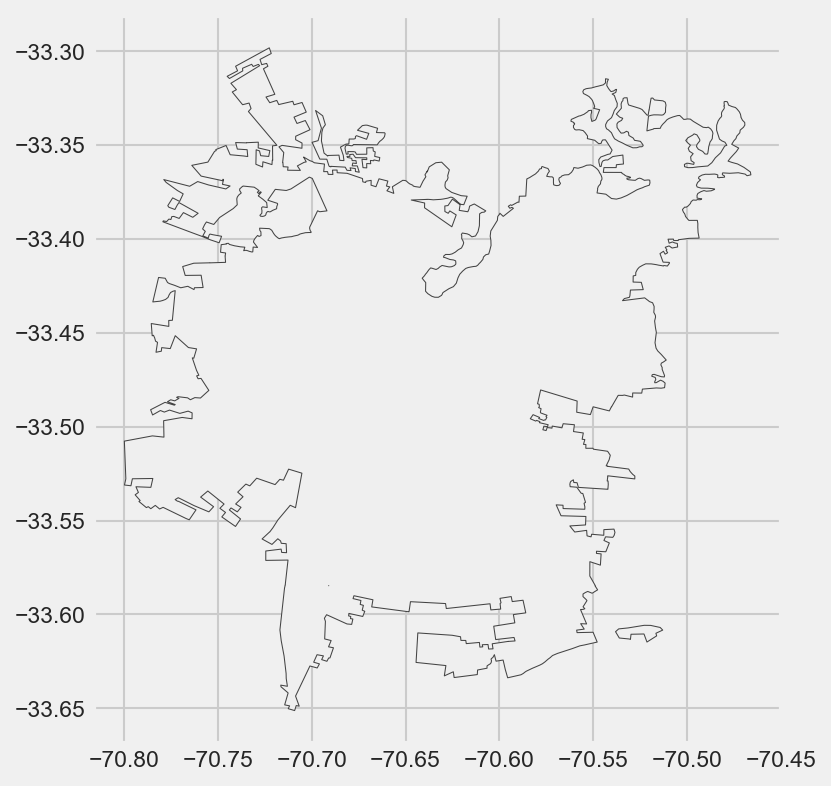

In [6]:
santiago_map.plot(color='#EFEFEF', edgecolor='#444444');

### Loading the Santiago's Streets Data

Now we will proceed to load the Santiago's streets dataset. This data can be downloaded by clicking in [this zip file](http://download.geofabrik.de/south-america/chile-latest-free.shp.zip).The dataset was compiled by [__GEOFABRIK__](http://download.geofabrik.de/south-america/chile.html), a community-maintained and free open source database that provides geodata from many different parts of the world that mainly works with free data from [__OpenStreetMap__](https://www.openstreetmap.org/). They are constantly updating, cleaning, and maintaining their databases for free public user access.

The zip file contains the data of the streets of Chile in different data format. For purpose of this project we will be using `.shp` file.

[Here](http://download.geofabrik.de/osm-data-in-gis-formats-free.pdf) is a pdf file with the documentation of this data written by Geofabrik. Here the reader can find descriptions of each column, description of data sources more in details, the relationships of Geofrabik data mining and OpenStreetMap, licenses that guarantees that this is a free source of data, the meaning of each feature class, among others. We use the pdf file to guide us in understanding how the data was compiled for us and understand the language they use to name their data's features. 

From the documentation of this dataset, it says that the  this dataset it was not required to convert the spatial coordinate system to __ESPG:4326__ since the documentation says that "All coordinates are unprojected WGS84 (EPSG:4326)". However, we found that when comparing the `geometry` column of 
 
`path = "../data/OSM_Chile/chile-latest-free-file/gis_osm_roads_free_1.shp"`

`santiago_streets_alfa = gpd.read_file(path, , encoding='utf-8')`

`santiago_streets_beta = gpd.read_file(path, , encoding='utf-8').to_crs({'init': 'epsg:4326'})`

`santiago_streets_alfa["geometry"] == santiago_streets_beta["geometry"]`

The output of above was `False`. Therefore we decided to change the coordinate system using `.to_crs({'init': 'epsg:4326'})`

For data cleaning:
- We change the name of the colum `fclass` to `street type`. Because for our purpose the feature class of interest in this data set is the type of streets. E.g.: We are interested in being able to differentiate in a pedestrian street (footway) or a highway for cars.
- We also dropped the rows that had `None` as value in the `name` column. Since the name of the streets does not exists then we thought it was better to drop those rows.

In [7]:
santiago_streets_file = gpd.read_file("data/OSM_Chile/chile-latest-free-file/gis_osm_roads_free_1.shp", encoding='utf-8')
santiago_streets = santiago_streets_file.to_crs({'init': 'epsg:4326'})
santiago_streets.rename(columns = {"fclass": "street type"}, inplace = True)
santiago_streets.dropna(subset = ['name'], inplace = True)
santiago_streets.reset_index(drop=True, inplace=True)
santiago_streets.head()

,osm_id,code,street type,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
0,7981156,5121,unclassified,21 de Mayo,None,B,0,0,F,F,"LINESTRING (-70.65020 -33.43489, -70.65024 -33..."
1,7981159,5114,secondary,Irene Morales,None,F,0,0,F,F,"LINESTRING (-70.63704 -33.43686, -70.63691 -33..."
2,7981160,5122,residential,Rosas,None,F,0,0,F,F,"LINESTRING (-70.65020 -33.43489, -70.65028 -33..."
3,7981313,5134,secondary_link,Teatinos,None,F,0,0,F,F,"LINESTRING (-70.65497 -33.43251, -70.65544 -33..."
4,7981317,5113,primary,San Antonio,None,F,0,0,F,F,"LINESTRING (-70.64872 -33.43309, -70.64875 -33..."


### Loading  Accidents Data

The Motorized Vehicles accidents was compiled by [__CONASET__](http://mapas-conaset.opendata.arcgis.com/) a Chilean goverment department of transit security. This dataset was elaborated with the help of [__Carabineros de Chile__](https://en.wikipedia.org/wiki/Carabineros_de_Chile), they are the national police department of Chile. In other words, Carabineros de Chile record the data since they are the ones who are present after an accident happens and then the data is take to CONASET to be processed and file

The datasets consist the registered list of accidents in the years 2015-2018. All accidents involve cars somehow.

It can be downloaded as zip files here:
- [2015](https://opendata.arcgis.com/datasets/dafa26dbce99467985596d8a58216b79_0.zip)
- [2016](https://opendata.arcgis.com/datasets/32ee49c703b840b885b9c80b37ae72d0_0.zip)
- [2017](https://opendata.arcgis.com/datasets/907addac92b74e3fa30d40edb72d1813_0.zip)
- [2018](https://www.arcgis.com/sharing/rest/content/items/ff520ff145614d5585f9905892e48957/data) 

Data cleaning:

- The data from 2015 was not the most detailed in terms of their features and the most detailed dataset was the 2018 accident dataset.

- It seems like the every year the CONASET and Carabineros have been improving the quality of dataset that they have been uploading. However, they still could have more informative information for they values such as Weather, or type of Streets or Roads. 



In [8]:
conaset_2018 = gpd.read_file("data/CONASET/SiniestrosRM2018/SiniestrosRM2018.shp", encoding = 'utf-8')
conaset_2018 = conaset_2018.rename(columns = {'id': 'ID', 
                                        'Ano':"Year",
                                        'IdAccident': 'Accident ID', 
                                        'Fecha':'Date',
                                        'Hora' :'Hour',
                                        'Cod_Comuna' : 'District_code',
                                        'Comuna': 'District',
                                        'Cod_Region': 'Region_code',
                                        'Cod_TipoAc' : 'Accident Type Code',
                                        'TipoAccide': 'Accident Type',
                                        'CodTipo_CO': 'CONASET Code Type',
                                        'Tipo_CONAS': 'CONASET Type', 
                                        'Cod_Zona':'Zone Code', 
                                        'Zona':'Zone',
                                        'Cod_Ubicac':'Location Code',
                                        'UbicacionR': 'Location',
                                        'Cod_Causa_':'Cause Code_',
                                        'Causa_CONA': 'Cause CONASET',
                                        'Cod_Causa' : "Cause Code",
                                        'Causa': 'Cause',
                                        'Cod_Calle_': "Street Code 1",
                                        'CalleUno' : "Street 1",
                                        'Cod_CalleD':'Street Code 2',
                                        'CalleDos': 'Street 2',
                                        'Numero': 'Number',  
                                        'Cod_Calzad' : 'Sidewalk Code', 
                                        'Calzada':'Sidewalk',
                                        'TipoCalzad':"Sidewalk Type",
                                        'Cod_Estado' : 'State Code', 
                                        'EstadoCalz': 'Sidewalk State',
                                        'Cod_Condic':'Weather Code',
                                        'CondicionC': 'Weather',
                                        'EstadoAtmo':'Atmospheric State',
                                        'Fallecidos':"Deaths Quantity", 
                                        'Graves':"Serious Injuries",
                                        'Menos_Grav':'Medium Injuries',
                                         'Leves':"Minor Injuries"})
# conaset_2018.columns
conaset_2018 = conaset_2018[["Year",  'Date','Hour','District','Accident Type','Zone','Location',
                            'Cause',"Street 1","Street 2",'Sidewalk',"Sidewalk Type",'Sidewalk State', 'Weather','Atmospheric State',
                            "Deaths Quantity", "Serious Injuries",'Medium Injuries',"Minor Injuries", 'geometry']]
conaset_2018.reset_index(drop=True, inplace=True)


In [9]:
conaset_2017 = gpd.read_file("data/CONASET/SiniestrosRM2017/SiniestrosRM2017.shp", encoding = 'utf-8')
conaset_2017 = conaset_2017.rename(columns = {'FID': 'ID', 
                                        'Año':"Year",
                                        'IdAccident': 'Accident ID', 
                                        'Fecha':'Date',
                                        'Hora' :'Hour',
                                        'Cod_Comuna' : 'District_code',
                                        'Comuna': 'District',
                                        'Cod_Region': 'Region_code',
                                        'Cod_TipoAc' : 'Accident Type Code',
                                        'Tipo_Accid': 'Accident Type',
                                        'CodTipo_CO': 'CONASET Code Type',
                                        'Tipo_CONAS': 'CONASET Type', 
                                        'Cod_Zona':'Zone Code', 
                                        'Zona':'Zone',
                                        'Cod_Ubicac':'Location Code',
                                        'Ubicación': 'Location',
                                        'Cod_Causa_':'Cause Code_',
                                        'Causa_CONA': 'Cause CONASET',
                                        'Cod_Causa' : "Cause Code",
                                        'Causa': 'Cause',
                                        'Cod_Calle_': "Street Code 1",
                                        'Calle_Uno' : "Street 1",
                                        'Cod_CalleD':'Street Code 2',
                                        'Calle_Dos': 'Street 2',
                                        'Numero': 'Number',  
                                        'Cod_Calzad' : 'Sidewalk Code', 
                                        'Calzada':'Sidewalk',
                                        'Tipo_Calza':"Sidewalk Type",
                                        'Cod_Estado' : 'State Code', 
                                        'EstadoCalz': 'Sidewalk State',
                                        'Cod_Condic':'Weather Code',
                                        'CondicionC': 'Weather',
                                        'EstadoAtmo':'Atmospheric State',
                                        'Fallecidos':"Deaths Quantity", 
                                        'Graves':"Serious Injuries",
                                        'Menos_Grav':'Medium Injuries',
                                               'Leves':"Minor Injuries"})
# conaset_2017.columns
conaset_2017 = conaset_2017[[ "Year",  'Date','Hour','District','Accident Type','Zone','Location',
                            'Cause',"Street 1","Street 2",'Sidewalk',"Sidewalk Type",
                            "Deaths Quantity", "Serious Injuries",'Medium Injuries',"Minor Injuries", 'geometry']]
#exclude Weather, Atomospheric State, Sidewalk Type
conaset_2017.reset_index(drop=True, inplace=True)


In [10]:
conaset_2016 = gpd.read_file("data/CONASET/SiniestrosRM2016/SiniestrosRM2016.shp", encoding = 'utf-8')
conaset_2016 = conaset_2016.rename(columns = {'FID': 'ID', 
                                        'Año':"Year",
                                        'IdAccident': 'Accident ID', 
                                        'Fecha':'Date',
                                        'Hora' :'Hour',
                                        'Cod_Comuna' : 'District_code',
                                        'Comuna': 'District',
                                        'Cod_Region': 'Region_code',
                                        'Cod_TipoAc' : 'Accident Type Code',
                                        'Tipo_Accid': 'Accident Type',
                                        'CodTipo_CO': 'CONASET Code Type',
                                        'Tipo_CONAS': 'CONASET Type', 
                                        'Cod_Zona':'Zone Code', 
                                        'Zona':'Zone',
                                        'Cod_Ubicac':'Location Code',
                                        'Ubicación': 'Location',
                                        'Cod_Causa_':'Cause Code_',
                                        'Causa_CONA': 'Cause CONASET',
                                        'Cod_Causa' : "Cause Code",
                                        'Causa': 'Cause',
                                        'Cod_Calle_': "Street Code 1",
                                        'Calle_Uno' : "Street 1",
                                        'Cod_CalleD':'Street Code 2',
                                        'Calle_Dos': 'Street 2',
                                        'Numero': 'Number',  
                                        'Cod_Calzad' : 'Sidewalk Code', 
                                        'Calzada':'Sidewalk',
                                        'Tipo_Calza':"Sidewalk Type",
                                        'Cod_Estado' : 'State Code', 
                                        'EstadoCalz': 'Sidewalk State',
                                        'Cod_Condic':'Weather Code',
                                        'CondicionC': 'Weather',
                                        'EstadoAtmo':'Atmospheric State',
                                        'Fallecidos':"Deaths Quantity", 
                                        'Graves':"Serious Injuries",
                                        'Menos_Grav':'Medium Injuries',
                                               'Leves':"Minor Injuries"})
# conaset_2016.columns
conaset_2016 = conaset_2016[["Year",  'Date','Hour','District','Accident Type','Zone','Location',
                            'Cause',"Street 1","Street 2",'Sidewalk',"Sidewalk Type", 
                            "Deaths Quantity", "Serious Injuries",'Medium Injuries',"Minor Injuries", 'geometry']]
conaset_2016.reset_index(drop=True, inplace=True)

#exclude Weather, Atomospheric State, Sidewalk Type

In [11]:
conaset_2015 = gpd.read_file("data/CONASET/SiniestrosRM2015/SiniestrosRM2015.shp", encoding = 'utf-8')
conaset_2015 = conaset_2015.rename(columns = {'FID': 'ID', 
                                        'Año':"Year",
                                        'IdAccident': 'Accident ID', 
                                        'Fecha':'Date',
                                        'Hora' :'Hour',
                                        'Cod_Comuna' : 'District_code',
                                        'Comuna': 'District',
                                        'Cod_Region': 'Region_code',
                                        'Cod_TipoAc' : 'Accident Type Code',
                                        'Tipo_Accid': 'Accident Type',
                                        'CodTipo_CO': 'CONASET Code Type',
                                        'Tipo_CONAS': 'CONASET Type', 
                                        'Cod_Zona':'Zone Code', 
                                        'Zona':'Zone',
                                        'Cod_Ubicac':'Location Code',
                                        'Ubicación': 'Location',
                                        'Cod_Causa_':'Cause Code_',
                                        'Causa_CONA': 'Cause CONASET',
                                        'Cod_Causa' : "Cause Code",
                                        'Causa': 'Cause',
                                        'Cod_Calle_': "Street Code 1",
                                        'CalleUno' : "Street 1",
                                        'Cod_CalleD':'Street Code 2',
                                        'CalleDos': 'Street 2',
                                        'Numero': 'Number',  
                                        'Cod_Calzad' : 'Sidewalk Code', 
                                        'Calzada':'Sidewalk',
                                        'Tipo_Calza':"Sidewalk Type",
                                        'Cod_Estado' : 'State Code', 
                                        'EstadoCalz': 'Sidewalk State',
                                        'Cod_Condic':'Weather Code',
                                        'CondicionC': 'Weather',
                                        'EstadoAtmo':'Atmospheric State',
                                        'Fallecido':"Deaths Quantity", 
                                        'Grave':"Serious Injuries",
                                        'MGrave':'Medium Injuries',
                                               'Leve':"Minor Injuries"})
conaset_2015 = conaset_2015[["District", 'Street 1', 'Street 2',
                            "Deaths Quantity", "Serious Injuries","Minor Injuries", 'geometry']]
#excluded "Year",  'Date','Hour','Accident Type','Zone','Location','Cause','Sidewalk',"Sidewalk Type",'Sidewalk State', 'Weather','Atmospheric State'

conaset_2015.reset_index(drop=True, inplace=True)


### Feature Engineering 

Most Feature Engineering of this project happens in the upcoming cells below.

- We change the format of `Date` feature to a more Python friendly.
- Extract the monthly information and created a `Month` feature
- Extract the daily information and created a `Day` feature
- Extract the quartely information and created a `Quarter` feature
- We calculated the day and week of an accident with respect to their Year and create `Day Of Year` and `Week_of_Year` feature respectively.
- Created `lambda` function to filter the `Date` by season and the create feature `Season`.
- Many of the district of Santiago were misspelled so we modify many values of the `District` feature.
- Create a column `Death` that is a binary column of 1s and 0s that tell us that whether or not a person died in the accident. It does not tell quantity.
- We created a `Holiday` feature with the list of Holidays from 2016 to 2018 that were celebrated nationwide.
- We converted the months and days into their numeric form. Those are `Month_Numeric` and `Day_Numeric` respectively.

In [12]:
frames = [conaset_2015, conaset_2016, conaset_2017, conaset_2018]

# conaset_df.rename
conaset_df = pd.concat(frames)
conaset_df.dropna(subset = ['Date'], inplace = True)
conaset_df["Hour"].replace(inplace=True,to_replace="1899-12-30T00:00:00.000Z",value="00:00")
conaset_df["Date"] = pd.to_datetime(conaset_df["Date"], utc = True)
conaset_df["Hour"] = pd.to_datetime(conaset_df['Hour'], format='%H:%M' , utc = True).dt.hour
conaset_df["Month"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.month 
conaset_df['Month'] = conaset_df['Month'].apply(lambda x: calendar.month_abbr[x])
conaset_df["Day"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.weekday_name
conaset_df["Year"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.year
conaset_df["Week_of_Year"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.weekofyear
conaset_df["Day Of Year"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.dayofyear
conaset_df["Quarter"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.quarter
conaset_df["Date"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.date

season_dict = lambda x: "Summer" if ((x< 12) | (x >= 51)) else "Fall" if ((x >= 12) & (x < 25)) else "Winter" if ((x >= 25) & (x < 38)) else "Spring"

conaset_df["Season"] = conaset_df["Week_of_Year"].map(season_dict)

conaset_df["District"].replace(["ÑUÑOA","ñuñoa"] , ["NUNOA" , "NUNOA"], inplace = True)
conaset_df["District"].replace(["PENALOLEN"] , ["PEÑALOLEN"], inplace = True)
conaset_df["District"].replace(["PE", "P. AGUIRRE CERDA"] , ["PEDRO AGUIRRE CERDA", "PEDRO AGUIRRE CERDA"], inplace = True)
conaset_df["District"].replace(["ESANTACION CENTRAL"] , ["ESTACION CENTRAL"], inplace = True)
# ['ALHUÉ', 'BUIN', 'CONCHALÍ', 'CURACAVÍ', 'EL MONTE', 'ESTACIÓN CENTRAL',
#        'ISLA DE MAIPO', 'MAIPÚ', 'MARÍA PINTO', 'MELIPILLA', 'PAINE',
#        'PEÑAFLOR', 'PEÑALOLÉN', 'SAN JOAQUÍN', 'SAN JOSÉ DE MAIPO',
#        'SAN PEDRO', 'SAN RAMÓN']
conaset_df["District"].replace(["ESTACION CENTRAL"] , ["ESTACIÓN CENTRAL"], inplace = True)
conaset_df["District"].replace(["CONCHALI"] , ["CONCHALÍ"], inplace = True)
conaset_df["District"].replace(["MAIPU"] , ["MAIPÚ"], inplace = True)
conaset_df["District"].replace(["PEÑALOLEN"] , ["PEÑALOLÉN"], inplace = True)
conaset_df["District"].replace(["SAN JOAQUIN"] , ["SAN JOAQUÍN"], inplace = True)
conaset_df["District"].replace(["SAN RAMON"] , ["SAN RAMÓN"], inplace = True)



conaset_df["Death"] = conaset_df["Deaths Quantity"].where(conaset_df["Deaths Quantity"] == 0, 1)

import datetime
holiday_list = [datetime.date(2018, 1, 1),
               datetime.date(2018, 3, 31),
               datetime.date(2018, 3, 30),
               datetime.date(2018, 5, 1),
               datetime.date(2018, 5, 21),
               datetime.date(2018, 7, 2),
               datetime.date(2018, 7, 16),
               datetime.date(2018, 8, 15),
               datetime.date(2018, 9, 17),
               datetime.date(2018, 9, 18),
               datetime.date(2018, 9, 19),
               datetime.date(2018, 10, 15),
               datetime.date(2018, 11, 1),
               datetime.date(2018, 11, 2),
               datetime.date(2018, 12, 8),
               datetime.date(2018, 12, 25),
               datetime.date(2018, 12, 31),
               datetime.date(2017, 1, 1),
               datetime.date(2017, 1, 2),
               datetime.date(2017, 4, 14),
               datetime.date(2017, 4, 15),
               datetime.date(2017, 5, 1),
               datetime.date(2017, 5, 21),
               datetime.date(2017, 6, 26),
               datetime.date(2017, 7, 16),
               datetime.date(2017, 8, 15),
               datetime.date(2017, 9, 18),
               datetime.date(2017, 9, 19),
               datetime.date(2017, 10, 9),
               datetime.date(2017, 10, 27),
               datetime.date(2017, 11, 1),
               datetime.date(2017, 12, 8),
               datetime.date(2017, 12, 25),
               datetime.date(2017, 12, 31),
               datetime.date(2016, 1, 1),
               datetime.date(2016, 3, 25),
               datetime.date(2016, 3, 26),
               datetime.date(2016, 5, 1),
               datetime.date(2016, 5, 21),
               datetime.date(2016, 6, 16),
               datetime.date(2016, 8, 15),
               datetime.date(2016, 9, 18),
               datetime.date(2016, 9, 17),
               datetime.date(2016, 9, 19),
               datetime.date(2016, 10, 10),
               datetime.date(2016, 10, 10),
               datetime.date(2016, 11, 1),
               datetime.date(2016, 10, 31),
               datetime.date(2016, 12, 8),
               datetime.date(2016, 12, 25),
               datetime.date(2016, 12, 31)]

conaset_df["Holiday"] = conaset_df["Date"].isin(holiday_list)

day_numeric = lambda x : 1 if x == "Monday" else 2 if x == "Tuesday" else 3 if x == "Wednesday" else 4 if x == "Thursday" else 5 if x == "Friday" else 6 if x == "Saturday" else 7
month_numeric = lambda x : 1 if x == "Jan" else 2 if x == "Feb" else 3 if x == "Mar" else 4 if x == "Apr" else 5 if x == "May" else 6 if x == "Jun" else 7 if x == "Jul" else 8 if x == "Aug" else 9 if x == "Sep" else 10 if x == "Oct" else 11 if x == "Novermber" else 12
conaset_df["Month_Numeric"] = conaset_df["Month"].map(month_numeric)
conaset_df["Day_Numeric"] = conaset_df["Day"].map(day_numeric)


conaset_df.rename(inplace=True, columns={"Sidewalk": "Road_Direction", "Sidewalk Type": "Road_Type"})
conaset_df.drop(inplace=True, columns=['Location', "Sidewalk State"])
conaset_df.reset_index(drop=True, inplace=True)
conaset_df.shape

/Users/cristobalza/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  after removing the cwd from sys.path.


(71947, 28)

In [13]:
conaset_df.columns

Index(['Accident Type', 'Atmospheric State', 'Cause', 'Date',
       'Deaths Quantity', 'District', 'Hour', 'Medium Injuries',
       'Minor Injuries', 'Serious Injuries', 'Road_Direction', 'Road_Type',
       'Street 1', 'Street 2', 'Weather', 'Year', 'Zone', 'geometry', 'Month',
       'Day', 'Week_of_Year', 'Day Of Year', 'Quarter', 'Season', 'Death',
       'Holiday', 'Month_Numeric', 'Day_Numeric'],
      dtype='object')

In [14]:
conaset_df["Cause"].value_counts().head(60)

CONDUCCION NO ATENTO CONDICIONES TRANSITO MOMENTO            16063
CAUSAS NO DETERMINADAS                                       13914
OTRAS CAUSAS                                                 10054
CONDUCCION SIN MANTENER DISTANCIA RAZONABLE NI PRUDENTE       4776
CONDUCCION CAMBIAR SORPRESIVAMENTE PISTA CIRCULACION          2890
PERDIDA CONTROL VEHICULO                                      2690
CONDUCCION EN ESTADO DE EBRIEDAD                              2603
SE                                                            2490
SEÑALIZACION DESOBEDECER LUZ ROJA DE SEMAFORO                 1862
SEÑALIZACION DESOBEDECER SEÑAL PARE                           1603
VIRAJES INDEBIDOS                                             1354
NO RESPETAR DERECHO PREFERENTE DE PASO A VEHICULO             1229
ADELANTAMIENTO SIN EL ESPACIO O TIEMPO SUFICIENTE             1122
CONDUCIR VEHICULO EN RETROCESO                                1094
NO RESPETAR DERECHO PREFERENTE DE PASO A PEATON               

### Loading 2017 Chilean Census Data


The 2017 Census data can be downloaded [here](https://www.bcn.cl/siit/estadisticasterritoriales/tema?id=168). We will use the Census data to normalize our Accidents data better. 

This dataset was also obtained from the BCN (same source as the Vector Maps).

__Feature Engineering__:

We created a new DataFrame called `census` that helped us to create the following features: 
- `Population_per_District` feature which is the $\mbox{# people by district}$
- `Accidents_per_District_Population` feature by calculating:
$$
\mbox{Accidents_per_District_Population} = \frac{\mbox{# accident per district}}{\mbox{# people by district}}
$$

- `Accidents_per_District_per_200000_People` feature by calculating:

$$
\mbox{Accidents_per_District_per_200000_People} = \frac{\mbox{# accident per district}}{\mbox{200,000 people}}
$$

We added these features to the rest of features that we have been working with in `conaset_df`.


In [15]:
census = pd.read_csv("data/BCN/Censo_2017_RM.csv")

census.rename(columns = {"Unidad territorial": "District"}, inplace = True)
census["District"] = census["District"].str.upper()
census["District"].replace(["ÑUÑOA"] , [ "NUNOA"], inplace = True)
census.rename(columns={ census.columns[2]: "Population_per_District" }, inplace = True)

census.drop(columns={ census.columns[1]}, inplace=True)

census["Population_per_District"] = census["Population_per_District"].astype(int)

census = census[census["District"].isin(conaset_df["District"].value_counts().sort_index().index)]

census["Accidents_per_District"] =  conaset_df["District"].value_counts().sort_index().values
census["Accidents_per_District_Population"] =  census["Accidents_per_District"] / census["Population_per_District"].values
census["Accidents_per_District_per_200000_People"] = census["Accidents_per_District"] / 200000

census.reset_index(drop=True, inplace=True)
census.set_index("District", inplace=True)
census.head()

,Population_per_District,Accidents_per_District,Accidents_per_District_Population,Accidents_per_District_per_200000_People
District,,,,
CALERA DE TANGO,25392,12,0.000473,0.000060
CERRILLOS,80832,1932,0.023901,0.009660
CERRO NAVIA,132622,704,0.005308,0.003520
COLINA,146207,1107,0.007571,0.005535
CONCHALÍ,126955,1028,0.008097,0.005140


In [16]:
conaset_df["Population_per_District"] = conaset_df["District"].map(census["Population_per_District"])
conaset_df["Accidents_per_District_per_Population"] = conaset_df["District"].map(census["Accidents_per_District_Population"])
conaset_df["Accidents_per_District_per_200000_People"] =  conaset_df["Population_per_District"]/ 200000

In [17]:
conaset_df["Accident Type"].value_counts()

COLISION LATERAL              18475
COLISION POR ALCANCE          12652
ATROPELLO                      7093
COLISION FRONTAL               4933
COLISION                       4369
CHOQUE FRENTE/POSTERIOR        4205
COLISION PERPENDICULAR         3840
CHOQUE FRONTAL                 3240
CAIDA                          1695
OTRO TIPO                      1601
VOLCADURA                      1541
CHOQUE POSTERIOR/FRENTE        1340
CHOQUE FRENTE/LADO             1151
CHOQUE POSTERIOR/POSTERIOR     1114
CHOQUE LATERAL                  936
CHOQUE LADO/LADO                867
CHOQUE POSTERIOR                586
CHOQUE                          584
CHOQUE POSTERIOR/LADO           467
CHOQUE LADO/FRENTE              428
CHOQUE FRENTE/FRENTE            399
CHOQUE LADO/POSTERIOR           339
IMPACTO CON ANIMAL               77
INCENDIO                         15
Name: Accident Type, dtype: int64

From above `conaset_df["Accident Type"].value_counts()`, we can observe that most accident happens in three different categories:
1. Collision accidents 
2. Run over accident
3. Other type of accidents such as Fires, Impact with an animal, or Car Tipping

We are gonna create three different DataFrames for each type accident registered.

Create a DataFrame only showing the collisions

In [18]:
colisions_santiago = conaset_df[(conaset_df["Accident Type"] == 'COLISION LATERAL') |
                      (conaset_df["Accident Type"] == 'COLISION POR ALCANCE')|
                      (conaset_df["Accident Type"] == 'COLISION FRONTAL')|
                      (conaset_df["Accident Type"] == 'COLISION PERPENDICULAR')|
                      (conaset_df["Accident Type"] == 'COLISION')|
                      (conaset_df["Accident Type"] == 'CHOQUE FRENTE/POSTERIOR')|
                      (conaset_df["Accident Type"] == 'CHOQUE FRONTAL')|
                      (conaset_df["Accident Type"] == 'CHOQUE POSTERIOR/POSTERIOR')|
                      (conaset_df["Accident Type"] == 'CHOQUE FRENTE/LADO')|
                      (conaset_df["Accident Type"] == 'CHOQUE POSTERIOR/FRENTE')|
                      (conaset_df["Accident Type"] == 'CHOQUE LATERAL')|
                      (conaset_df["Accident Type"] == 'CHOQUE LADO/LADO')|
                      (conaset_df["Accident Type"] == 'CHOQUE POSTERIOR')|
                      (conaset_df["Accident Type"] == 'CHOQUE LADO/FRENTE')|
                      (conaset_df["Accident Type"] == 'CHOQUE') |
                      (conaset_df["Accident Type"] == 'CHOQUE FRENTE/FRENTE') |
                      (conaset_df["Accident Type"] == 'CHOQUE POSTERIOR/LADO') |
                      (conaset_df["Accident Type"] == 'CHOQUE LADO/POSTERIOR')]

Create a DataFrame showing only the run overs accident produced by drivers.

In [19]:
run_over_santiago = conaset_df[(conaset_df["Accident Type"] == 'ATROPELLO')]

Create a DataFrame showing accidents that were not collisions nor run overs.

In [20]:
other_santiago = conaset_df[(conaset_df["Accident Type"] == 'INCENDIO')|
                               (conaset_df["Accident Type"] == 'IMPACTO CON ANIMAL') |
                               (conaset_df["Accident Type"] == 'VOLCADURA') |
                               (conaset_df["Accident Type"] == 'OTRO TIPO')]

***

## Let's Visualize the maps of different types of accidents using Geopandas

Let's proceed to join the Vectorial Map of Santiago with the Streets of Santiago. We use the `.sjoin` function of `Geopandas`.

In [21]:
streets_join_map = gpd.sjoin(santiago_streets, santiago_map, op='intersects')

Now we can create a map that only show us the streets that __no pedestrian__ use. __This is only for motorized vehicles.__

In [22]:
car_roads = streets_join_map[
                (streets_join_map["street type"] == 'tertiary') |
                  (streets_join_map["street type"] == 'tertiary_link') |
                  (streets_join_map["street type"] == 'secondary') |
                  (streets_join_map["street type"] == 'secondary_link') |
                  (streets_join_map["street type"] == 'primary') |
                  (streets_join_map["street type"] == 'primary_link') |
                  (streets_join_map["street type"] == 'motorway') |
                  (streets_join_map["street type"] == 'motorway_linkt')]

Here we will plot the main arteries for automobile vehicles and motorcycles in Santiago. Graph below includes main highways and avenues of the city.

/Users/cristobalza/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:471: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  "Only specify one of 'column' or 'color'. Using 'color'.", UserWarning


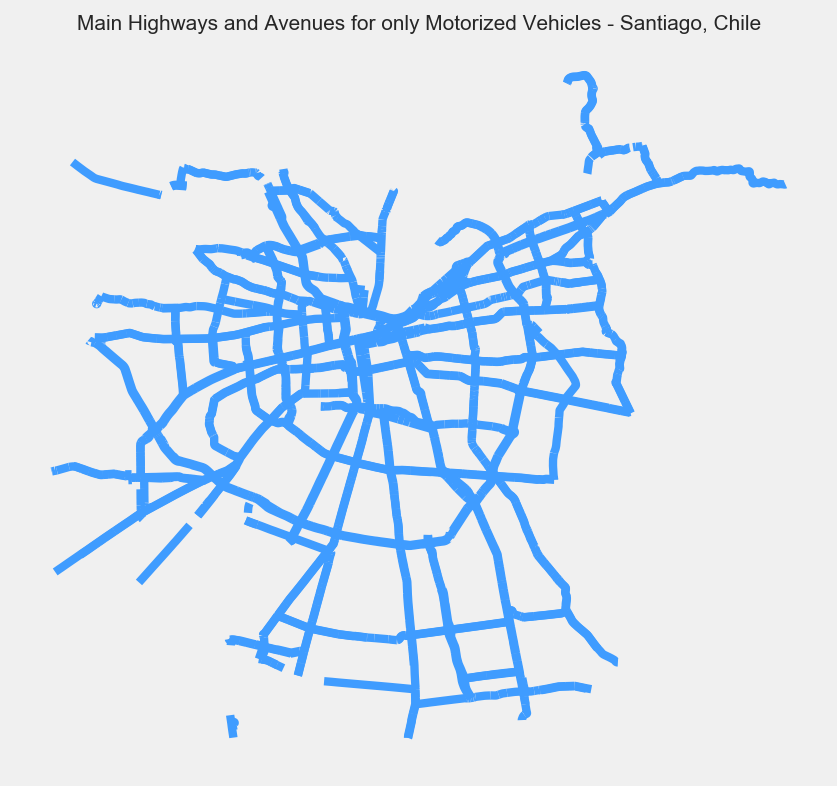

In [23]:
main_roads = car_roads[(car_roads["street type"] == 'primary')]
main_roads.plot(column='street type', color = '#3F9CFF', edgecolor='#444444')
plt.axis('off')
plt.title("Main Highways and Avenues for only Motorized Vehicles - Santiago, Chile", size= 10);

Now, let's see all the pedestrian streets. 

In [24]:
non_car_roads = streets_join_map[(streets_join_map["street type"] == "residential")|
                                   (streets_join_map["street type"] == "living_street") |
                                   (streets_join_map["street type"] == "footway")|
                                   (streets_join_map["street type"] == "pedestrian") |
                                   (streets_join_map["street type"] == "steps")|
                                   (streets_join_map["street type"] ==  "track")]

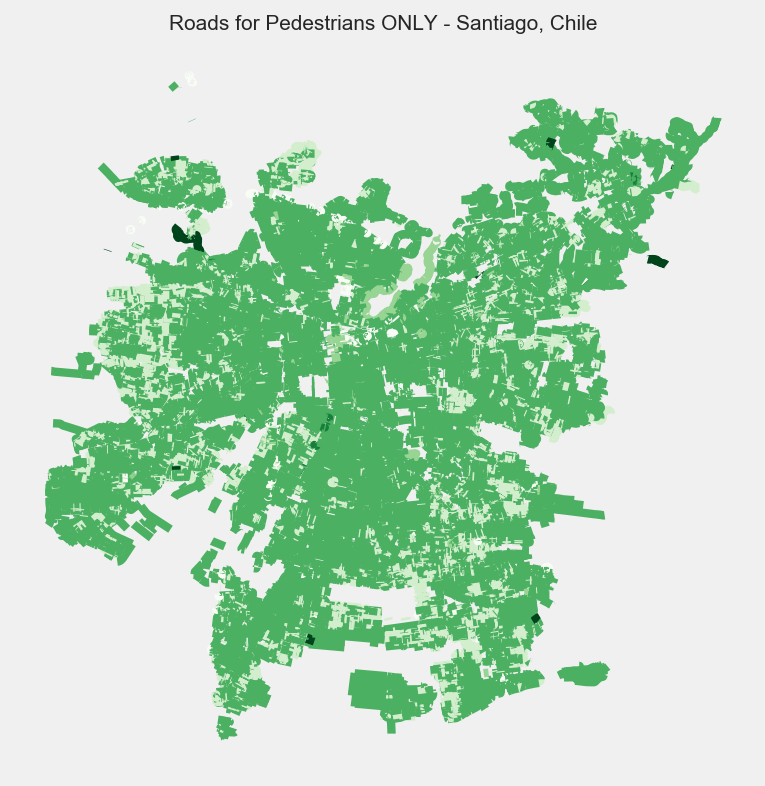

In [25]:
non_car_roads.plot(column='street type', cmap = 'Greens', edgecolor='#444444');
plt.axis('off');
plt.title("Roads for Pedestrians ONLY - Santiago, Chile", size= 10);

Since the pedestrian streets are a too cluttered we will focus on the main streets maps.

### Localize Run Overs in the Map

We join the run overs accidents by drivers and the santiago map.

In [26]:
runover_join_map = gpd.sjoin(run_over_santiago, santiago_map, op='intersects')

Show the accidents in terms of the main roads

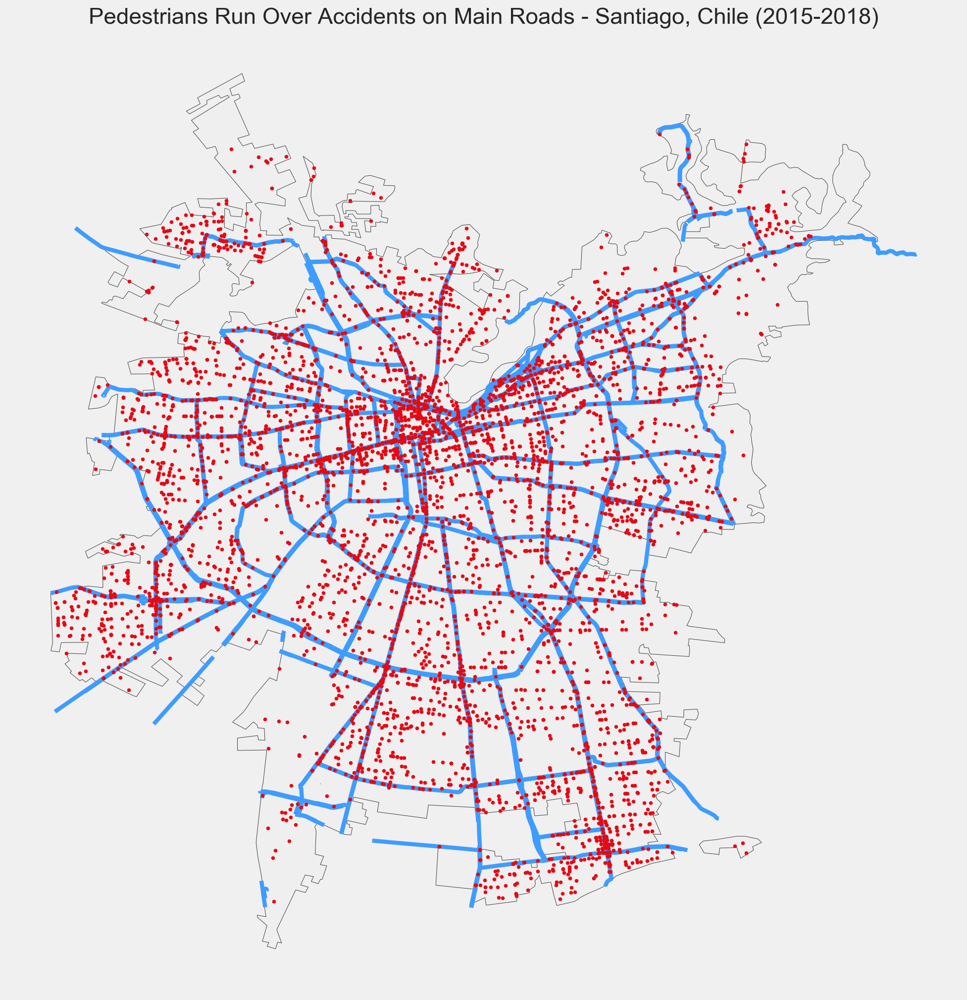

In [105]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='#3F9CFF', markersize=1)
runover_join_map.plot(ax=ax, color='#e50914', markersize=10, zorder = 2)
plt.title("Pedestrians Run Over Accidents on Main Roads - Santiago, Chile (2015-2018)", size= 22)
plt.axis('off');

Show accidents in terms of non-vehicles roads. __Only pedestrian use.__

In [94]:
# ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
# non_car_roads.plot(ax=ax, color='#1ed760', markersize = 1)
# runover_join_map.plot(ax=ax, color='#e50914',markersize=5, zorder=2)
# plt.title("Run Overs on Pedestrian Roads - Santiago, Chile (2015-2018)", size = 22)
# plt.axis('off');

From above plots we can start seeing a relationship between the main streets of Santiago and the number of Run over accidents. Let's see what happens with the Collision only portion of the CONASET dataset.

### Join Colisions with Santiago Maps


In [29]:
collison_join_map = gpd.sjoin(colisions_santiago, santiago_map, op='intersects')

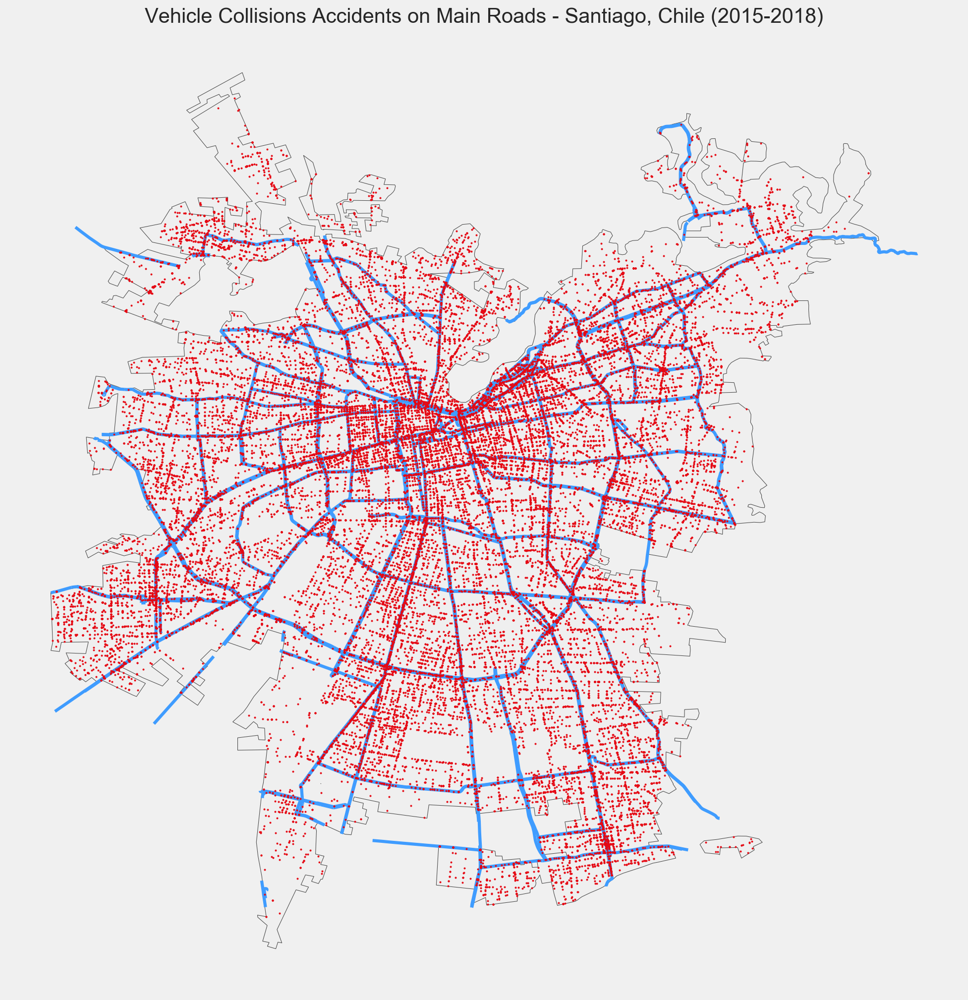

In [107]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='#3F9CFF', linewidth=3)
collison_join_map.plot(ax=ax, color='#e50914', markersize=2, zorder=2)
plt.title("Vehicle Collisions Accidents on Main Roads - Santiago, Chile (2015-2018)", size = 20)
plt.axis('off');

In [93]:
# ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
# non_car_roads.plot(ax=ax, color='#1ed760', markersize=1)
# main_roads.plot(ax=ax, color='#3F9CFF', linewidth=1)
# collison_join_map.plot(ax=ax, color='#e50914', markersize=2, zorder=2)
# plt.title("Collision Car Accidents on Pedestrian Roads - Santiago, Chile (2015-2018)", size = 20)
# plt.axis('off');

### Other accidents in the map

In [32]:
other_join_map = gpd.sjoin(other_santiago, santiago_map, op='intersects')

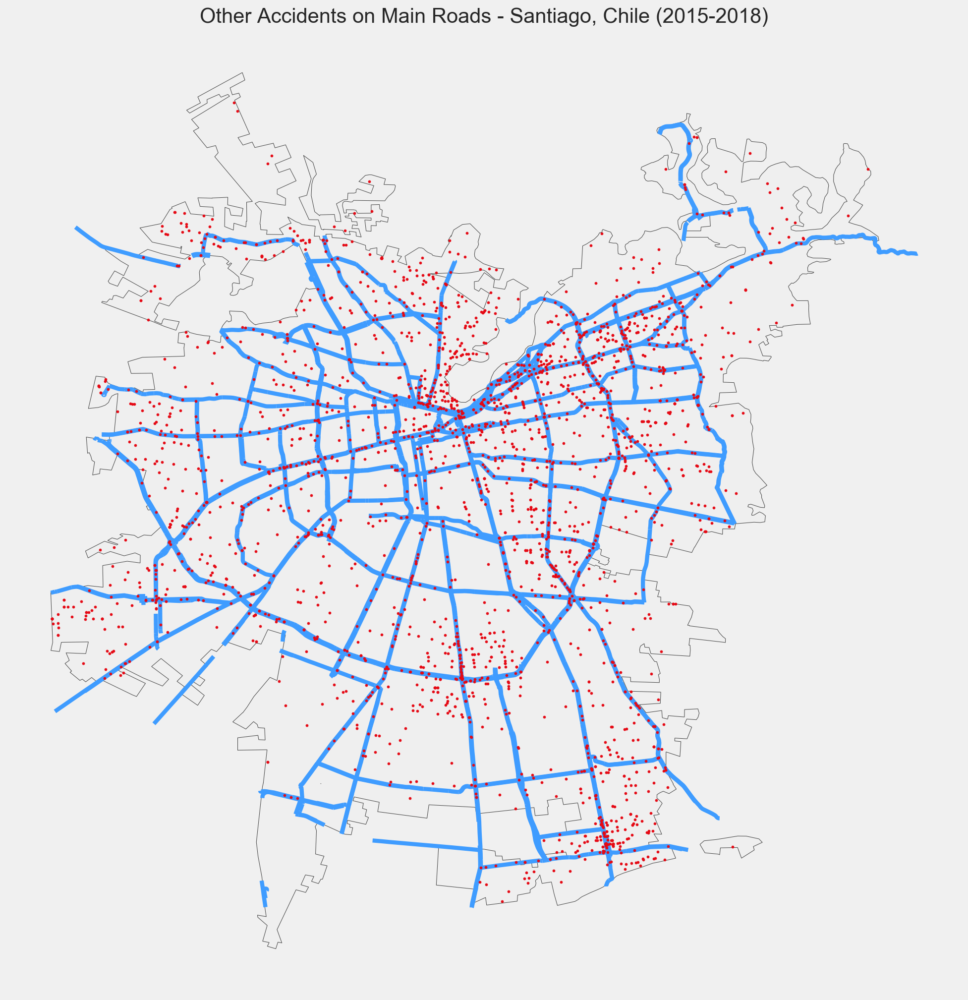

In [108]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='#3F9CFF', markersize=1)
other_join_map.plot(ax=ax, color='#e50914', markersize=5, zorder=2)
plt.title("Other Accidents on Main Roads - Santiago, Chile (2015-2018)", size = 20)
plt.axis('off');

In [95]:
# ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
# non_car_roads.plot(ax=ax, color='#1ed760', markersize=1)
# main_roads.plot(ax=ax, color='#3F9CFF', linewidth=1)
# other_join_map.plot(ax=ax, color='#e50914', markersize=5, zorder=99)
# plt.title("Other Accidents on Pedestrian Roads - Santiago, Chile (2015-2018)", size = 20)
# plt.axis('off');

### Casualties

In [35]:
casualties_map = conaset_df[conaset_df["Death"] == 1]
casualties_map = gpd.sjoin(casualties_map, santiago_map, op='intersects')
all_accidents_map = gpd.sjoin(conaset_df, santiago_map, op ='intersects')

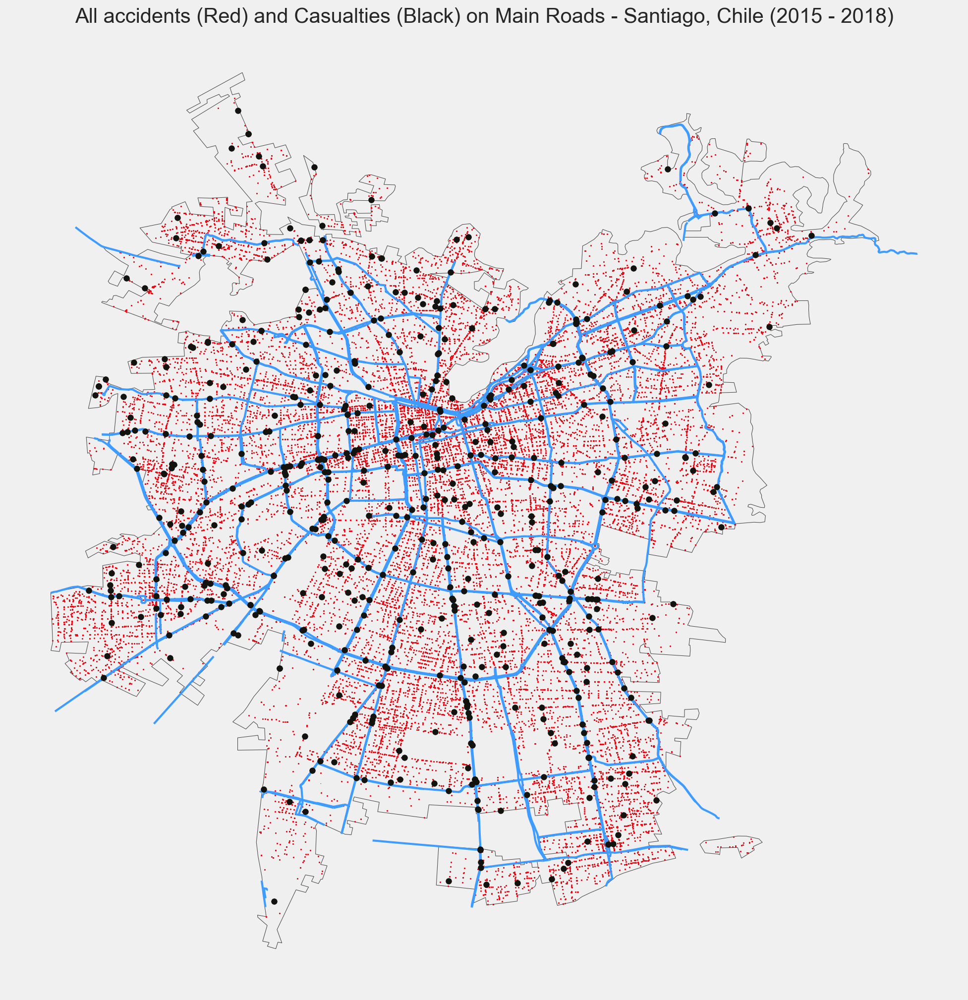

In [114]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='#3F9CFF', linewidth=2)
all_accidents_map.plot(ax=ax, color='#e50914', markersize=1, zorder = 1)
casualties_map.plot(ax=ax, color='#12130F',  markersize=30, zorder=99)


plt.title("All accidents (Red) and Casualties (Black) on Main Roads - Santiago, Chile (2015 - 2018)", size = 20)
plt.axis('off')
plt.savefig("./output/images/santiago_casualties.png");

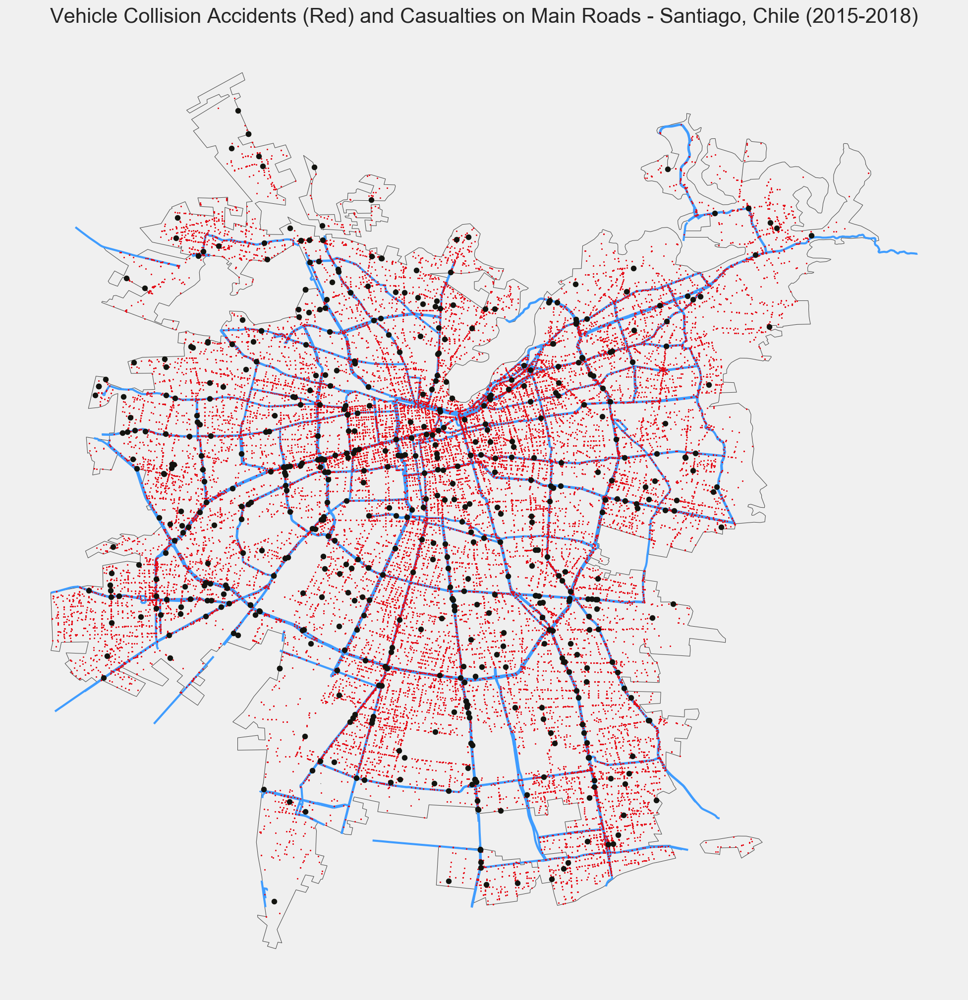

In [111]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='#3F9CFF', linewidth=2)
collison_join_map.plot(ax=ax, color='#e50914', markersize=1, zorder=2)
casualties_map.plot(ax=ax, color='#12130F',  markersize=25, zorder=99)

plt.title("Vehicle Collision Accidents (Red) and Casualties on Main Roads - Santiago, Chile (2015-2018)", size = 20)
plt.axis('off');

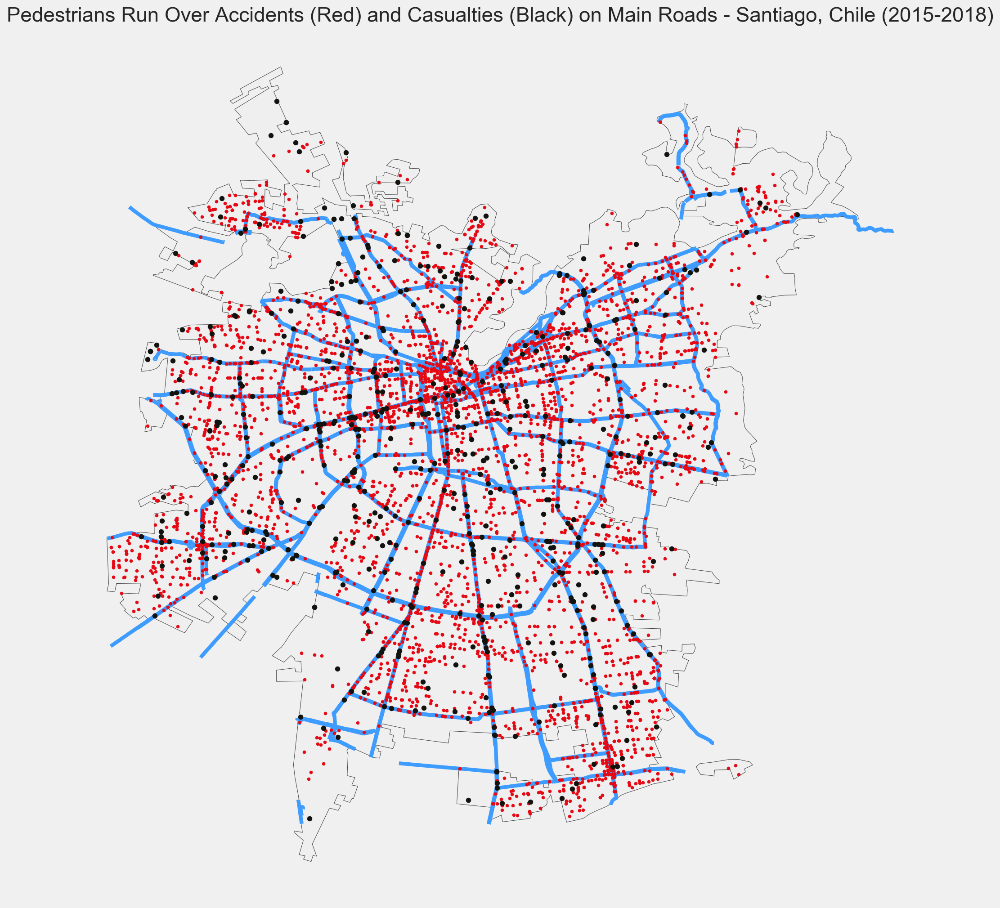

In [113]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='#3F9CFF', markersize=1)
runover_join_map.plot(ax=ax, color='#e50914', markersize=10, zorder = 2)
casualties_map.plot(ax=ax, color='#12130F',  markersize=25, zorder=99)

plt.title("Pedestrians Run Over Accidents (Red) and Casualties (Black) on Main Roads - Santiago, Chile (2015-2018)", size= 22)
plt.axis('off');

***

## Percentages

In [37]:
dead_run_over = len(run_over_santiago[run_over_santiago["Deaths Quantity"] != 0]) / len(run_over_santiago)
survived_run_over = len(run_over_santiago[run_over_santiago["Deaths Quantity"] == 0]) / len(run_over_santiago)
print(f"percentage of dying in a run over:   {dead_run_over*100} %")
print(f"percentage of surviving a run over:  {survived_run_over*100}%")

percentage of dying in a run over:   4.525588608487241 %
percentage of surviving a run over:  95.47441139151276%


In [38]:
dead_colission = len(colisions_santiago[colisions_santiago["Deaths Quantity"] != 0]) / len(colisions_santiago)
survived_colission = len(colisions_santiago[colisions_santiago["Deaths Quantity"] == 0]) / len(colisions_santiago)
print(f"percentage of dying in a collision:    {dead_colission*100} %")
print(f"percentage of surviving a collision:  {survived_colission*100} %")

percentage of dying in a collision:    0.5089695452649144 %
percentage of surviving a collision:  99.49103045473508 %


In [39]:
dead_other = len(other_santiago[other_santiago["Deaths Quantity"] != 0]) / len(other_santiago)
survived_other = len(other_santiago[other_santiago["Deaths Quantity"] == 0]) / len(other_santiago)
print(f"percentage of dying in an other type of accident:   {dead_other*100} %")
print(f"percentage of surviving an other type of accident:  {survived_other*100} %")

percentage of dying in an other type of accident:   1.1750154607297465 %
percentage of surviving an other type of accident:  98.82498453927026 %


Although the GeoData gives us an impressive visualizations in terms of the three mentioned above type of accidents, their proportions do not differ significantly. 

From now on, we will be working with the entire accident dataset `conaset_df` (unless we specify by year, time, etc).

Let's look at the entire accident dataset's proportion.

In [40]:
dead_total = len(conaset_df[conaset_df["Deaths Quantity"] != 0]) / len(conaset_df)
survived_total = len(conaset_df[conaset_df["Deaths Quantity"] == 0]) / len(conaset_df)
print(f"percentage of dying in accidents:      {dead_total*100} %")
print(f"percentage of surviving in accidents:  {survived_total*100} %")

percentage of dying in accidents:      0.9298511404228111 %
percentage of surviving in accidents:  99.07014885957719 %


In [41]:
conaset_df.to_csv('./output/conaset_full.csv')

***

## Visualizations

We will explore the data using visualizations using the `Seaborn` library.

### Plots using Seaborn 

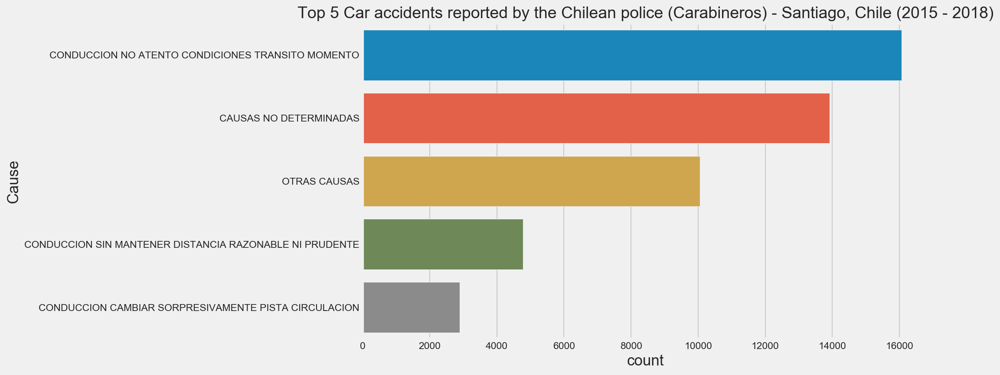

In [42]:
sns.countplot(data=conaset_df, y = "Cause", order = conaset_df["Cause"].value_counts().index[0:5,])
plt.title("Top 5 Car accidents reported by the Chilean police (Carabineros) - Santiago, Chile (2015 - 2018)", size= 18);

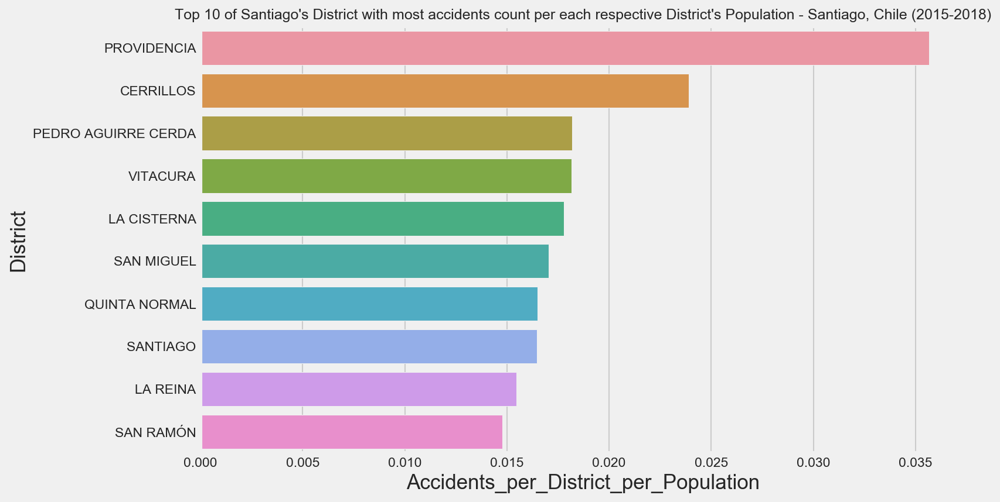

In [43]:
districts_top_10 = census["Accidents_per_District_Population"].sort_values(ascending = False).index[0:10,]
sns.barplot(x=conaset_df["Accidents_per_District_per_Population"], y=conaset_df["District"], order =districts_top_10 )
# sns.countplot(data=conaset_df, y = "District", order = conaset_df["District"].value_counts().index[0:10,])
plt.title("Top 10 of Santiago's District with most accidents count per each respective District's Population - Santiago, Chile (2015-2018)", size = 12);

In [44]:
census["Accidents_per_District_per_200000_People"].sort_values(ascending = False).index[0:10,]

Index(['SANTIAGO', 'PUENTE ALTO', 'MAIPÚ', 'PROVIDENCIA', 'LAS CONDES',
       'LA FLORIDA', 'NUNOA', 'EL BOSQUE', 'ESTACIÓN CENTRAL', 'PUDAHUEL'],
      dtype='object', name='District')

In [45]:
census["Accidents_per_District_per_200000_People"].sort_values(ascending = False).index[0:10,]

Index(['SANTIAGO', 'PUENTE ALTO', 'MAIPÚ', 'PROVIDENCIA', 'LAS CONDES',
       'LA FLORIDA', 'NUNOA', 'EL BOSQUE', 'ESTACIÓN CENTRAL', 'PUDAHUEL'],
      dtype='object', name='District')

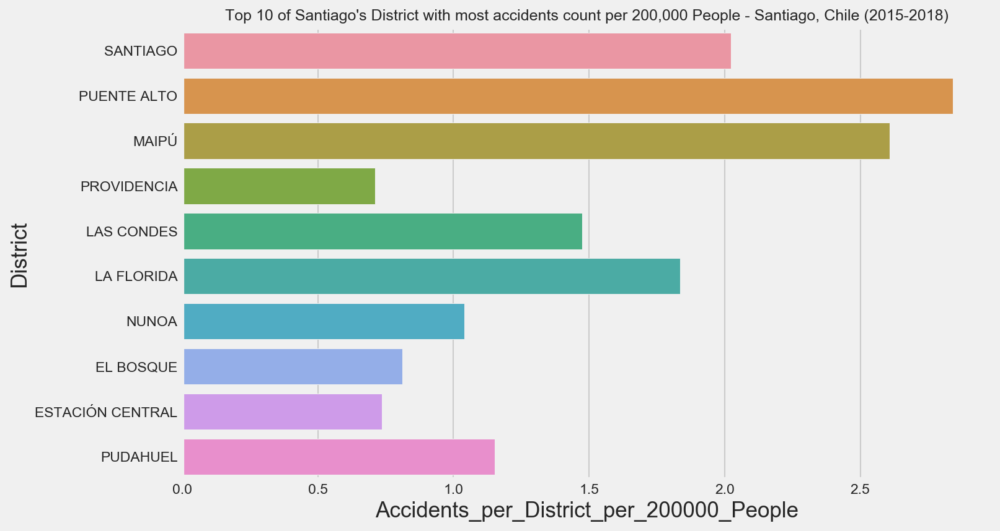

In [46]:
districts_top_10 = census["Accidents_per_District_per_200000_People"].sort_values(ascending = False).index[0:10,]
sns.barplot(x=conaset_df["Accidents_per_District_per_200000_People"], y=conaset_df["District"], order =districts_top_10 )
# sns.countplot(data=conaset_df, y = "District", order = conaset_df["District"].value_counts().index[0:10,])
plt.title("Top 10 of Santiago's District with most accidents count per 200,000 People - Santiago, Chile (2015-2018)", size = 12);

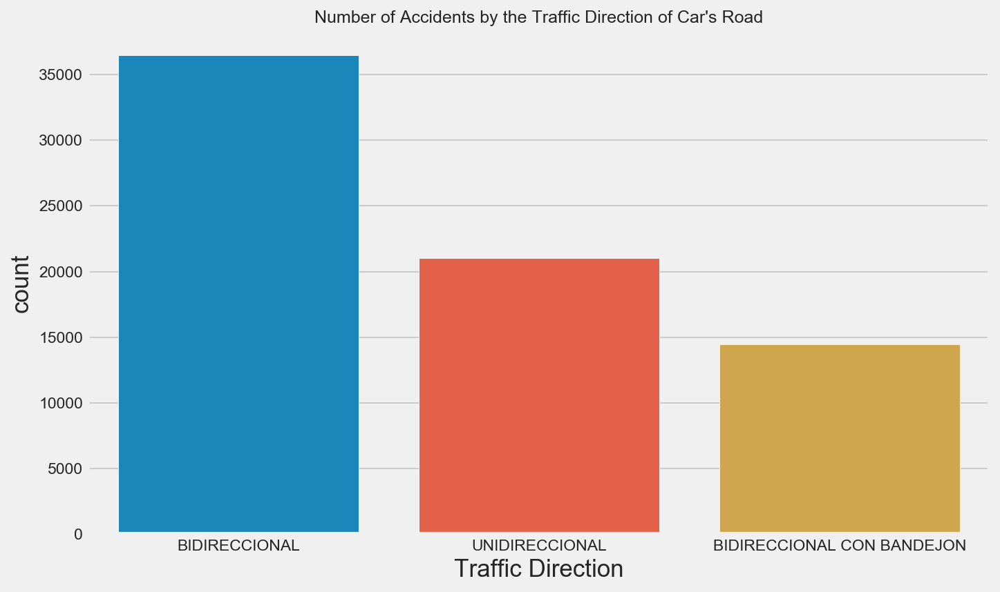

In [47]:
sns.countplot(data=conaset_df, x = "Road_Direction")
plt.title("Number of Accidents by the Traffic Direction of Car's Road", size = 12)
plt.xlabel("Traffic Direction");

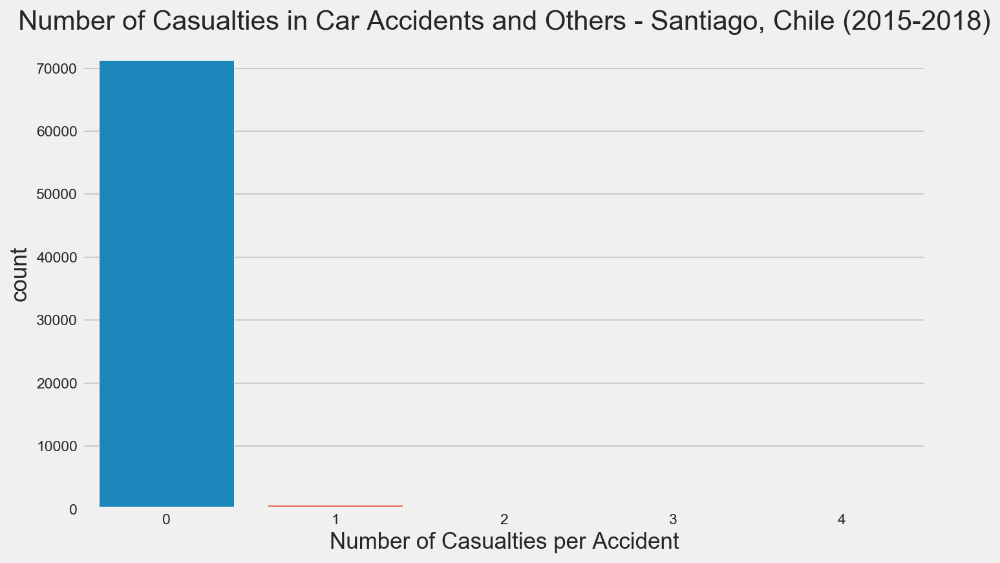

In [48]:
sns.countplot(data=conaset_df, x = "Deaths Quantity")
plt.title("Number of Casualties in Car Accidents and Others - Santiago, Chile (2015-2018)")
plt.xlabel("Number of Casualties per Accident");

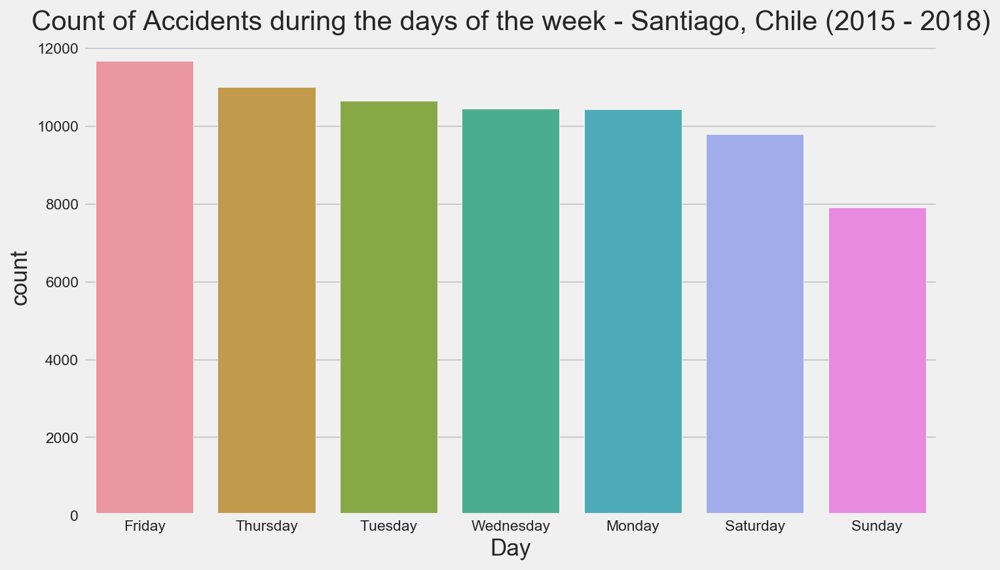

In [49]:
sns.countplot(data=conaset_df, x = "Day", order = conaset_df["Day"].value_counts().index)
plt.title("Count of Accidents during the days of the week - Santiago, Chile (2015 - 2018)");

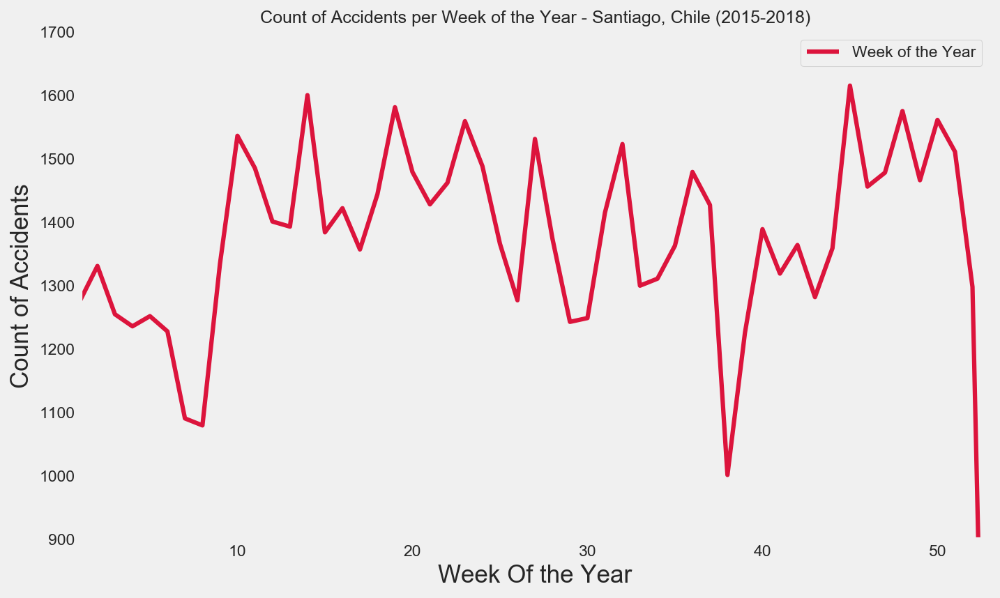

In [50]:
weeks_index = np.array(conaset_df["Week_of_Year"].value_counts().sort_index().index)
weeks_values = np.array(conaset_df["Week_of_Year"].value_counts().sort_index().values)
sns.lineplot(x = weeks_index,  y = weeks_values, label = "Week of the Year", color='crimson', lw= 3)
plt.xlabel("Week Of the Year")
plt.ylabel("Count of Accidents")
plt.ylim((900,1700))
plt.xlim((1,53))
plt.grid()
plt.title("Count of Accidents per Week of the Year - Santiago, Chile (2015-2018)", size = 12);

Here we see something very interesting in our dataset that might be very relevant for later results.

We see some drops in accident's count at:
- Nearly at the end of summer, where most people people leave the capital for vacations 
- At the week 38 is around mid September, where Chileans have the "Fiestas Patrias", which it can be translate as a national week off from work due to the independence process of the country from the Spanish Crown (1810-1818). This similar to the Spring Break in the United States, this break applies to students and most workers nationwide though.

However, we have one more and by the biggest drop in Accident counts during the last two weeks of the year. The natural question that comes up to the reader is that *are people not having accidents during Christmas and New Years?*. People have car accidents all the time, so clearly we cannot have that hypothesis.

I think in this plot we have found important data inputed wrong. In other words, for some reason the Conaset didn't not input the accident data for the last weeks of the year 2015-2018. 

Let's see if see the same problem below in another visualization.

In [51]:
season_df = conaset_df.groupby(["Season"]).count()[["Cause"]].rename(columns={"Cause": "Accident_Count"}).sort_values(by = "Accident_Count")
season_df

,Accident_Count
Season,
Summer,16999
Winter,17858
Spring,18092
Fall,18998


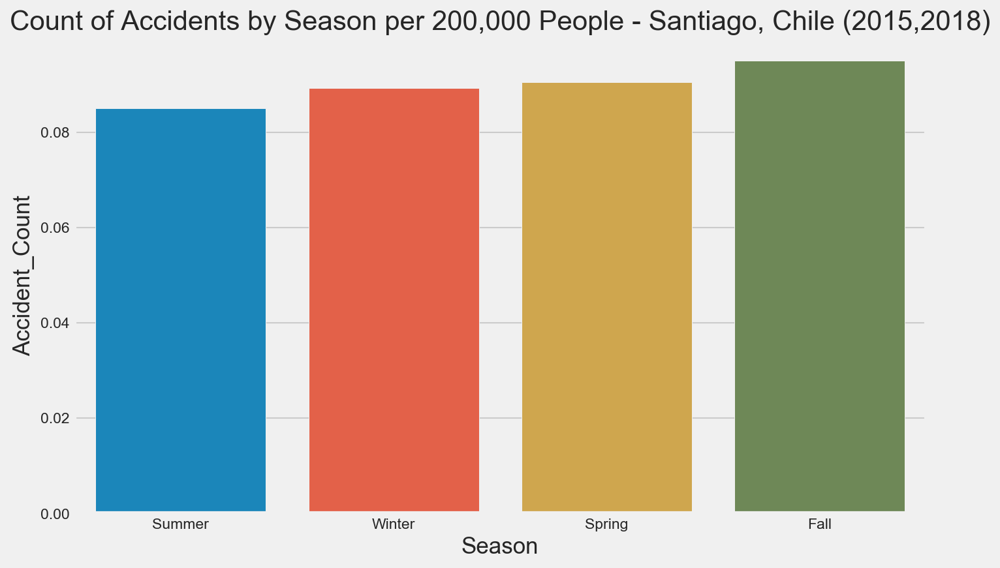

In [52]:
sorting = season_df.index
sns.barplot(x=season_df.index, y=season_df["Accident_Count"] / 200000, order =sorting )
plt.title("Count of Accidents by Season per 200,000 People - Santiago, Chile (2015,2018)");

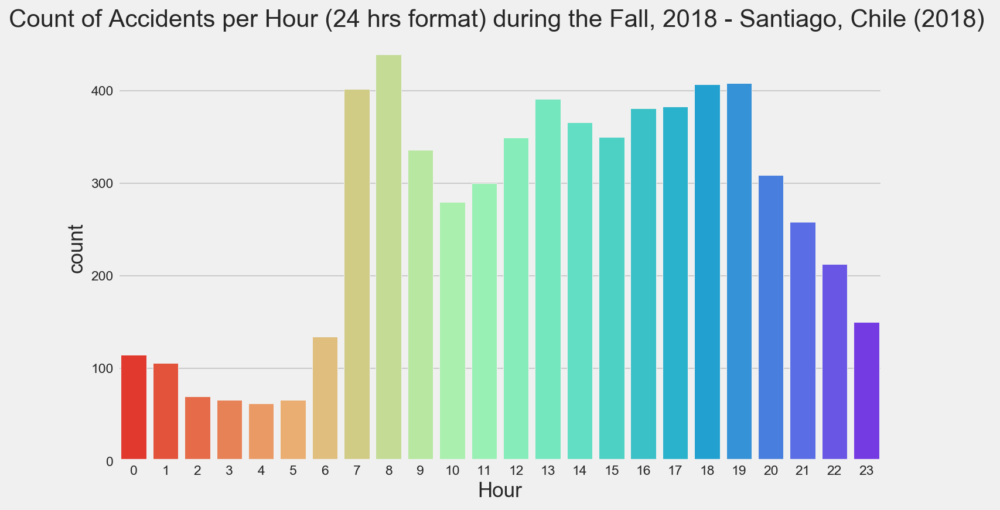

In [53]:
accidents_fall_2018 = conaset_df[(conaset_df["Year"] == 2018) & (conaset_df["Season"] == "Fall")]
sns.countplot(data=accidents_fall_2018, x = "Hour",palette="rainbow_r")
plt.title("Count of Accidents per Hour (24 hrs format) during the Fall, 2018 - Santiago, Chile (2018) ");

### Matrix Heatmaps


In [54]:
#Determine the number of accidents for each day of the week by month (combine years 2015-2018)
def RTAs_by_month(df, month):
    month_list = []
    mon, tues, wed, thurs, fri, sat, sun = 0,0,0,0,0,0,0
    
    for idx, row in df.iterrows():
        if row["Month"] == month and row["Day"] == "Monday": mon +=1
        elif row["Month"] == month and row["Day"] == "Tuesday": tues +=1
        elif row["Month"] == month and row["Day"] == "Wednesday": wed +=1
        elif row["Month"] == month and row["Day"] == "Thursday": thurs +=1
        elif row["Month"] == month and row["Day"] == "Friday": fri +=1
        elif row["Month"] == month and row["Day"] == "Saturday": sat +=1
        elif row["Month"] == month and row["Day"] == "Sunday": sun +=1
        else: a=0 

    month_list.append(mon)
    month_list.append(tues)
    month_list.append(wed)
    month_list.append(thurs)
    month_list.append(fri)
    month_list.append(sat)
    month_list.append(sun)
        
    return(month_list)

In [55]:
#Extract RTA data for each day by month
january = RTAs_by_month(conaset_df, "Jan")
february = RTAs_by_month(conaset_df, "Feb")
march = RTAs_by_month(conaset_df, "Mar")
april = RTAs_by_month(conaset_df, "Apr")
may = RTAs_by_month(conaset_df, "May")
june = RTAs_by_month(conaset_df, "Jun")
july = RTAs_by_month(conaset_df, "Jul")
august = RTAs_by_month(conaset_df, "Aug")
september = RTAs_by_month(conaset_df, "Sep")
october = RTAs_by_month(conaset_df, "Oct")
november = RTAs_by_month(conaset_df, "Nov")
december = RTAs_by_month(conaset_df, "Dec")

In [56]:
#Create matrix for the heatmap
colmns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
data = np.array([january, february, march, april, may, june, july, august, september, october, november, december])
heatmap_df = pd.DataFrame(data=data, index=rows, columns=colmns)
heatmap_df.head()

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
January,874,830,815,717,885,712,619
February,766,669,666,681,733,632,544
March,911,930,1024,1111,1048,831,603
April,902,955,789,934,1025,866,703
May,937,1065,943,1019,983,887,652


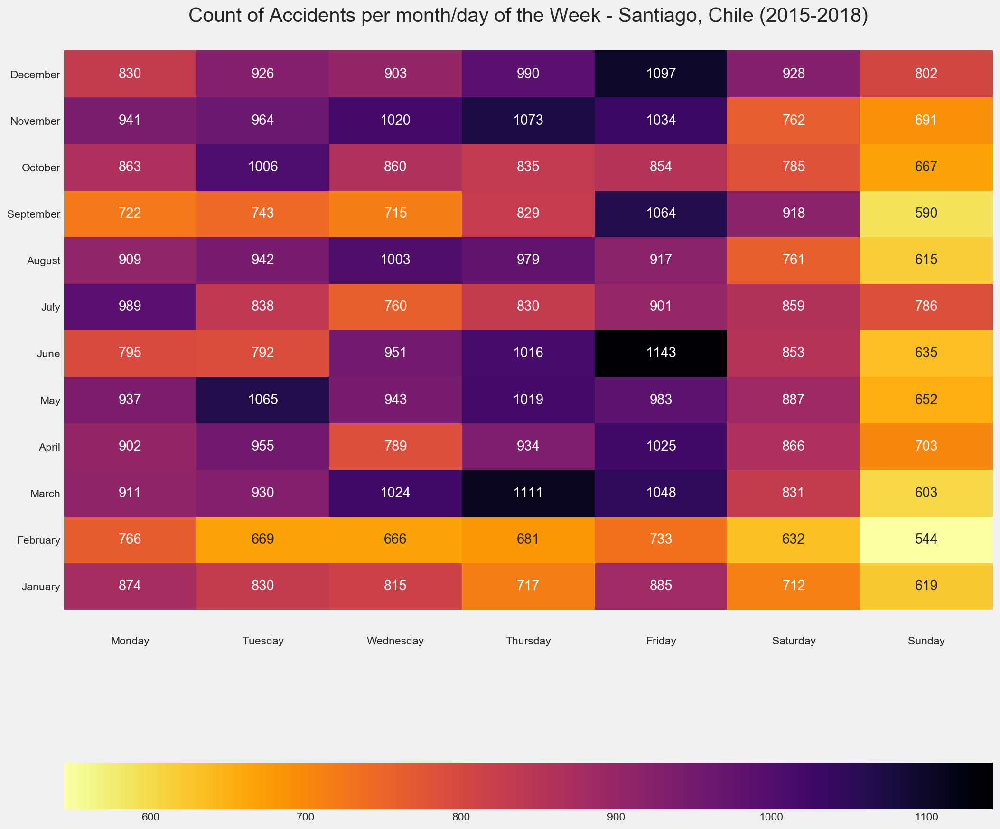

In [57]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_df, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Count of Accidents per month/day of the Week - Santiago, Chile (2015-2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

In [58]:
#Function to determine number of accidents for each hour per day
def RTAs_by_hour(df, hour):
    hour_list = []
    mon, tues, wed, thurs, fri, sat, sun = 0,0,0,0,0,0,0
    
    for idx, row in df.iterrows():
        if row["Hour"] == hour and row["Day"] == "Monday": mon +=1
        elif row["Hour"] == hour and row["Day"] == "Tuesday": tues +=1
        elif row["Hour"] == hour and row["Day"] == "Wednesday": wed +=1
        elif row["Hour"] == hour and row["Day"] == "Thursday": thurs +=1
        elif row["Hour"] == hour and row["Day"] == "Friday": fri +=1
        elif row["Hour"] == hour and row["Day"] == "Saturday": sat +=1
        elif row["Hour"] == hour and row["Day"] == "Sunday": sun +=1
        else: a=0 

    hour_list.append(mon)
    hour_list.append(tues)
    hour_list.append(wed)
    hour_list.append(thurs)
    hour_list.append(fri)
    hour_list.append(sat)
    hour_list.append(sun)
    

    
    return(hour_list)

In [59]:
accidents_fall_2018 = conaset_df[(conaset_df["Year"] == 2018) & (conaset_df["Season"] == "Fall")]
hour_0 = RTAs_by_hour(accidents_fall_2018, 0)
hour_1 = RTAs_by_hour(accidents_fall_2018, 1)
hour_2 = RTAs_by_hour(accidents_fall_2018, 2)
hour_3 = RTAs_by_hour(accidents_fall_2018, 3)
hour_4 = RTAs_by_hour(accidents_fall_2018, 4)
hour_5 = RTAs_by_hour(accidents_fall_2018, 5)
hour_6 = RTAs_by_hour(accidents_fall_2018, 6)
hour_7 = RTAs_by_hour(accidents_fall_2018, 7)
hour_8 = RTAs_by_hour(accidents_fall_2018, 8)
hour_9 = RTAs_by_hour(accidents_fall_2018, 9)
hour_10 = RTAs_by_hour(accidents_fall_2018, 10)
hour_11 = RTAs_by_hour(accidents_fall_2018, 11)
hour_12 = RTAs_by_hour(accidents_fall_2018, 12)
hour_13 = RTAs_by_hour(accidents_fall_2018, 13)
hour_14 = RTAs_by_hour(accidents_fall_2018, 14)
hour_15 = RTAs_by_hour(accidents_fall_2018, 15)
hour_16 = RTAs_by_hour(accidents_fall_2018, 16)
hour_17 = RTAs_by_hour(accidents_fall_2018, 17)
hour_18 = RTAs_by_hour(accidents_fall_2018, 18)
hour_19 = RTAs_by_hour(accidents_fall_2018, 19)
hour_20 = RTAs_by_hour(accidents_fall_2018, 20)
hour_21 = RTAs_by_hour(accidents_fall_2018, 21)
hour_22 = RTAs_by_hour(accidents_fall_2018, 22)
hour_23 = RTAs_by_hour(accidents_fall_2018, 23)

In [60]:
#Create matrix for the heatmap
columns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = ["0am", "1am", "2am", "3am", "4am", "5am", "6am", "7am", "8am", "9am", "10am", "11am", "12pm", "1pm", "2pm", "3pm","4pm","5pm","6pm","7pm","8pm","9pm","10pm","11pm"]
data = np.array([hour_0, hour_1, hour_2, hour_3, hour_4, hour_5, hour_6, hour_7, hour_8, hour_9, hour_10, hour_11, hour_12, hour_13, hour_14, hour_15, hour_16, hour_17, hour_18, hour_19, hour_20, hour_21, hour_22, hour_23])
heatmap_hour_fall = pd.DataFrame(data=data, index=rows, columns=columns)
heatmap_hour_fall.head(2)

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0am,14,15,11,17,20,18,20
1am,8,11,13,9,12,20,33


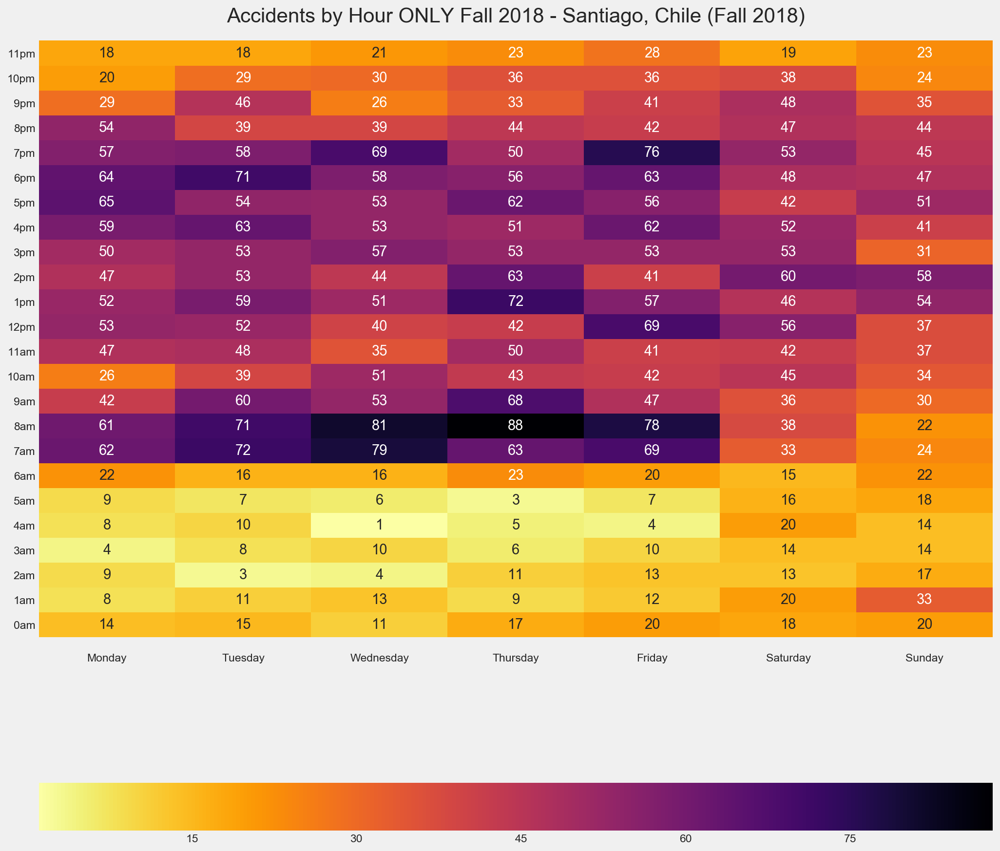

In [61]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_hour_fall, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Accidents by Hour ONLY Fall 2018 - Santiago, Chile (Fall 2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

In [62]:
accidents_only_2018 = conaset_df[(conaset_df["Year"] == 2018)]
hour_0 = RTAs_by_hour(accidents_only_2018, 0)
hour_1 = RTAs_by_hour(accidents_only_2018, 1)
hour_2 = RTAs_by_hour(accidents_only_2018, 2)
hour_3 = RTAs_by_hour(accidents_only_2018, 3)
hour_4 = RTAs_by_hour(accidents_only_2018, 4)
hour_5 = RTAs_by_hour(accidents_only_2018, 5)
hour_6 = RTAs_by_hour(accidents_only_2018, 6)
hour_7 = RTAs_by_hour(accidents_only_2018, 7)
hour_8 = RTAs_by_hour(accidents_only_2018, 8)
hour_9 = RTAs_by_hour(accidents_only_2018, 9)
hour_10 = RTAs_by_hour(accidents_only_2018, 10)
hour_11 = RTAs_by_hour(accidents_only_2018, 11)
hour_12 = RTAs_by_hour(accidents_only_2018, 12)
hour_13 = RTAs_by_hour(accidents_only_2018, 13)
hour_14 = RTAs_by_hour(accidents_only_2018, 14)
hour_15 = RTAs_by_hour(accidents_only_2018, 15)
hour_16 = RTAs_by_hour(accidents_only_2018, 16)
hour_17 = RTAs_by_hour(accidents_only_2018, 17)
hour_18 = RTAs_by_hour(accidents_only_2018, 18)
hour_19 = RTAs_by_hour(accidents_only_2018, 19)
hour_20 = RTAs_by_hour(accidents_only_2018, 20)
hour_21 = RTAs_by_hour(accidents_only_2018, 21)
hour_22 = RTAs_by_hour(accidents_only_2018, 22)
hour_23 = RTAs_by_hour(accidents_only_2018, 23)

In [63]:
#Create matrix for the heatmap
columns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = ["0am", "1am", "2am", "3am", "4am", "5am", "6am", "7am", "8am", "9am", "10am", "11am", "12pm", "1pm", "2pm", "3pm","4pm","5pm","6pm","7pm","8pm","9pm","10pm","11pm"]
data = np.array([hour_0, hour_1, hour_2, hour_3, hour_4, hour_5, hour_6, hour_7, hour_8, hour_9, hour_10, hour_11, hour_12, hour_13, hour_14, hour_15, hour_16, hour_17, hour_18, hour_19, hour_20, hour_21, hour_22, hour_23])
heatmap_hour = pd.DataFrame(data=data, index=rows, columns=columns)
heatmap_hour.head(2)

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0am,76,70,56,63,73,76,81
1am,39,45,32,42,49,74,86


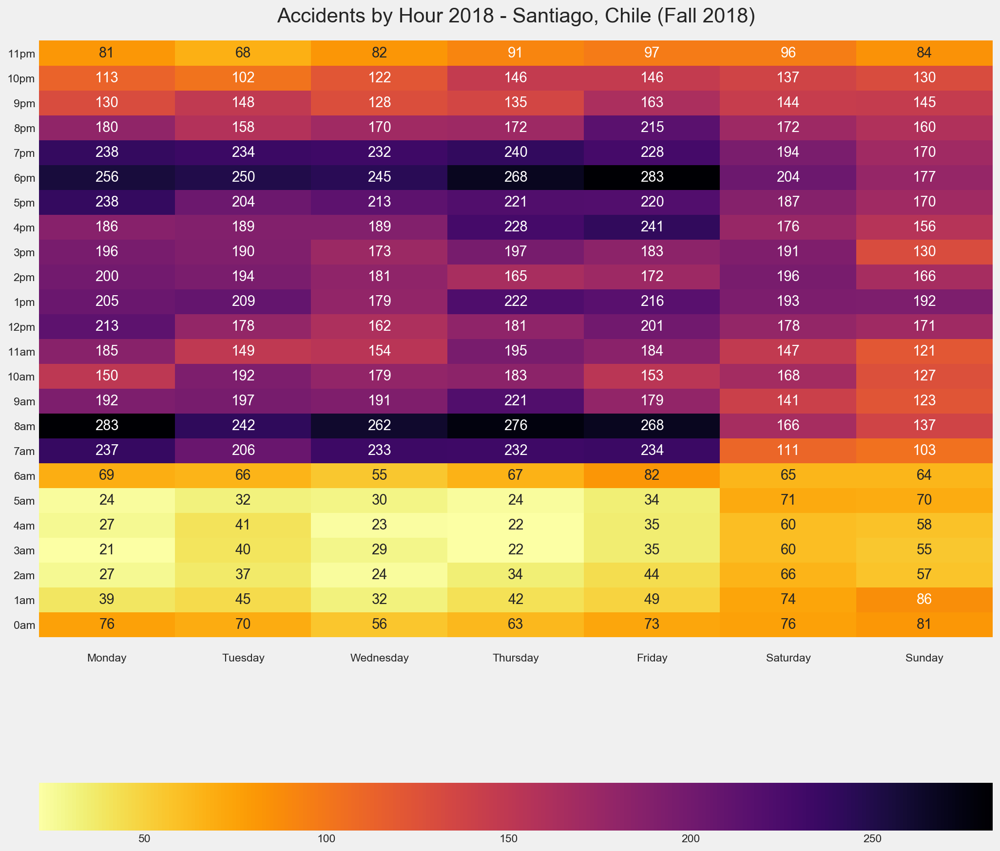

In [64]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_hour, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Accidents by Hour 2018 - Santiago, Chile (Fall 2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

In [65]:
#Function to determine number of accidents for per Season of year (2015-2018)

def RTAs_by_season(df, season):
    season_list = []
    mon, tues, wed, thurs, fri, sat, sun = 0,0,0,0,0,0,0
    
    for idx, row in df.iterrows():
        if row["Season"] == season and row["Day"] == "Monday": mon +=1
        elif row["Season"] == season and row["Day"] == "Tuesday": tues +=1
        elif row["Season"] == season and row["Day"] == "Wednesday": wed +=1
        elif row["Season"] == season and row["Day"] == "Thursday": thurs +=1
        elif row["Season"] == season and row["Day"] == "Friday": fri +=1
        elif row["Season"] == season and row["Day"] == "Saturday": sat +=1
        elif row["Season"] == season and row["Day"] == "Sunday": sun +=1
        else: a=0 

    season_list.append(mon)
    season_list.append(tues)
    season_list.append(wed)
    season_list.append(thurs)
    season_list.append(fri)
    season_list.append(sat)
    season_list.append(sun)
        
    return(season_list)

In [66]:
fall = RTAs_by_season(conaset_df, "Fall")
summer = RTAs_by_season(conaset_df, "Summer")
winter = RTAs_by_season(conaset_df, "Winter")
spring = RTAs_by_season(conaset_df, "Spring")

In [67]:
#Create matrix for the heatmap
colmns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = ["Summer", "Fall", "Winter", "Spring"]
data = np.array([summer, fall, winter, spring])
heatmap_season = pd.DataFrame(data=data, index=rows, columns=colmns)
heatmap_season.head(2)

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Summer,2504,2415,2458,2566,2851,2305,1900
Fall,2731,2879,2713,2988,3066,2622,1999


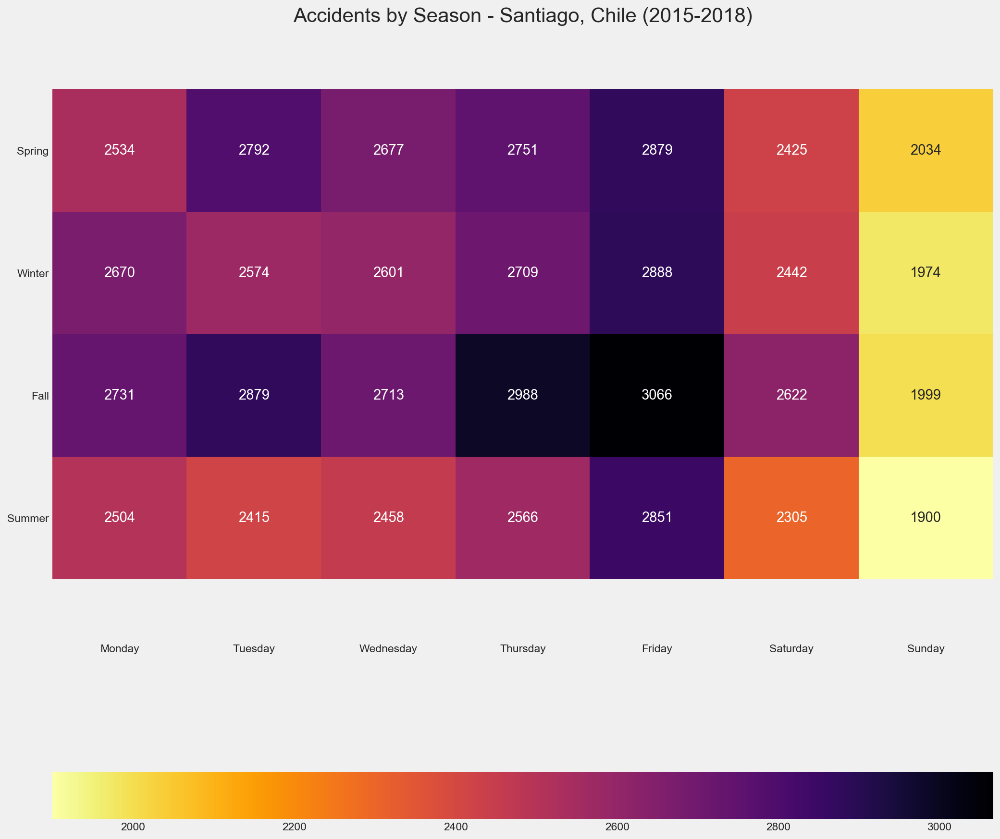

In [68]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_season, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Accidents by Season - Santiago, Chile (2015-2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

In [69]:
#Function to determine number of accidents for each day of the week

def RTAs_by_week(df, target):
    arr = []
    mon, tues, wed, thurs, fri, sat, sun = 0,0,0,0,0,0,0
    
    for idx, row in df.iterrows():
        if row["Week_of_Year"] == target and row["Day"] == "Monday": mon +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Tuesday": tues +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Wednesday": wed +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Thursday": thurs +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Friday": fri +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Saturday": sat +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Sunday": sun +=1
        else: a=0 

    arr.append(mon)
    arr.append(tues)
    arr.append(wed)
    arr.append(thurs)
    arr.append(fri)
    arr.append(sat)
    arr.append(sun)
        
    return(arr)

In [70]:
columns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = []
for i in range(53):
    rows.append("Week " + str(i+1))
data = []
for e in range(53):
    data.append(RTAs_by_week(conaset_df, e+1))
heatmap_week = pd.DataFrame(data=data, index=rows, columns=columns)
heatmap_week.head(2)

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Week 1,188,180,179,172,199,206,152
Week 2,217,174,226,163,254,177,120


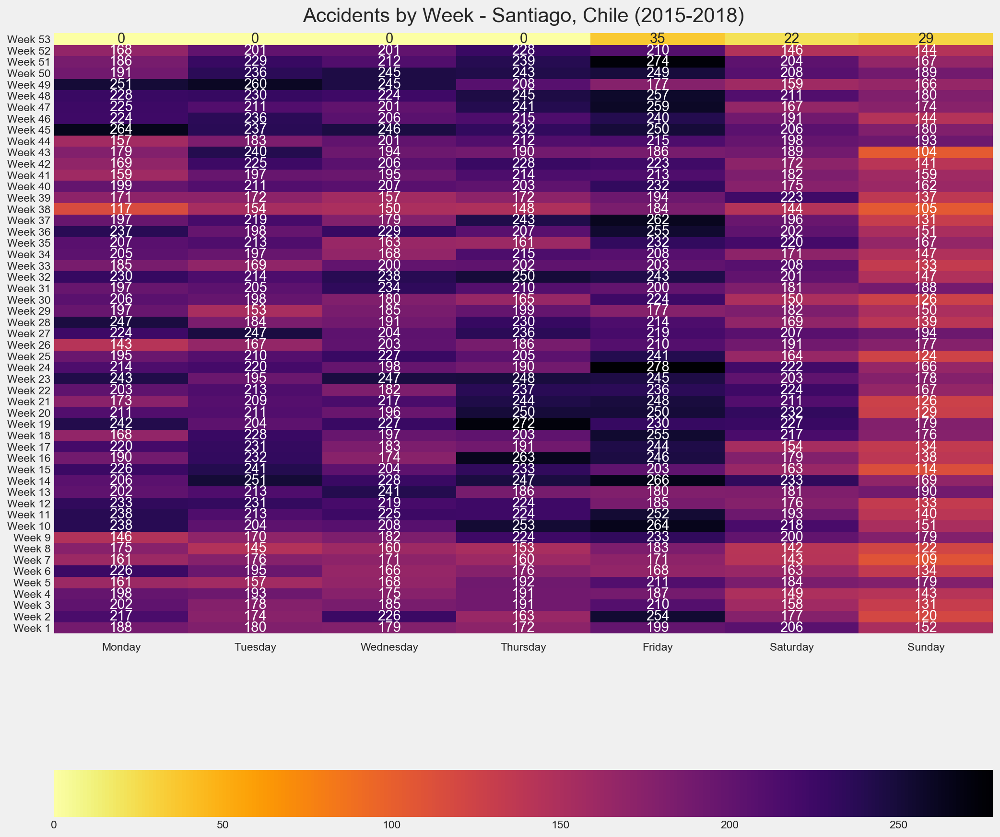

In [71]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_week, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Accidents by Week - Santiago, Chile (2015-2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

***